In [1]:
# Mount Google Drive (for storing dataset and saving models)
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!pip install tensorflow

In [1]:
!venv\Scripts\activate

In [2]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16, ResNet50, EfficientNetB0
from tensorflow.keras.layers import Dense, Flatten, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

In [2]:
# Define paths for data and model saving
data_dir = 'dataset'
test_dir = 'testset'

In [14]:
# Set up data augmentation for training
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255,
    rotation_range=30,
    brightness_range=[0.7, 1.3],
    zoom_range=0.2,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    validation_split=0.2
)

# Data generator for testing (no augmentation, only rescaling)
test_datagen = ImageDataGenerator(rescale=1.0/255)

# Training and validation data generators
train_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=(224, 224),
    batch_size=16,  # Smaller batch size for better generalization
    class_mode='categorical',
    subset='training'
)

val_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    subset='validation'
)

# Testing data generator (no augmentation applied here)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)


Found 3180 images belonging to 4 classes.
Found 792 images belonging to 4 classes.
Found 257 images belonging to 4 classes.


In [15]:
def build_model(base_model, num_classes=4):
    x = base_model.output
    x = Flatten()(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    return model


In [16]:
# Define paths for saving models
vgg_path = 'model_vgg.h5'
resnet_path = 'model_resnet.h5'
effnet_path = 'model_effnet.h5'


In [21]:
# List to store models
models = []
histories = []

# Initialize and compile VGG16
vgg16 = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
model_vgg = build_model(vgg16)
model_vgg.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])
model_vgg.fit(train_generator, validation_data=val_generator, epochs=20)
models.append(model_vgg)

# Save VGG16 model
model_vgg.save(vgg_path)





Epoch 1/20
199/199 ━━━━━━━━━━━━━━━━━━━━ 125s 586ms/step - accuracy: 0.3378 - loss: 1.3796 - val_accuracy: 0.5189 - val_loss: 1.0958
Epoch 2/20
199/199 ━━━━━━━━━━━━━━━━━━━━ 129s 534ms/step - accuracy: 0.6037 - loss: 0.9073 - val_accuracy: 0.6503 - val_loss: 0.8402
Epoch 3/20
199/199 ━━━━━━━━━━━━━━━━━━━━ 148s 561ms/step - accuracy: 0.6771 - loss: 0.7851 - val_accuracy: 0.6553 - val_loss: 0.7855
Epoch 4/20
199/199 ━━━━━━━━━━━━━━━━━━━━ 106s 522ms/step - accuracy: 0.7018 - loss: 0.7326 - val_accuracy: 0.7083 - val_loss: 0.7042
Epoch 5/20
199/199 ━━━━━━━━━━━━━━━━━━━━ 109s 533ms/step - accuracy: 0.7500 - loss: 0.6305 - val_accuracy: 0.6187 - val_loss: 0.9199
Epoch 6/20
199/199 ━━━━━━━━━━━━━━━━━━━━ 107s 523ms/step - accuracy: 0.7508 - loss: 0.6332 - val_accuracy: 0.7071 - val_loss: 0.7222
Epoch 7/20
199/199 ━━━━━━━━━━━━━━━━━━━━ 109s 527ms/step - accuracy: 0.7654 - loss: 0.6069 - val_accuracy: 0.6818 - val_loss: 0.7375
Epoch 8/20
199/199 ━━━━━━━━━━━━━━━━━━━━ 142s 533ms/step - accuracy: 0.7763 -

In [24]:
# Initialize and compile ResNet50
resnet = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
model_resnet = build_model(resnet)
model_resnet.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])
model_resnet.fit(train_generator, validation_data=val_generator, epochs=10)
models.append(model_resnet)

# Save ResNet50 model
model_resnet.save(resnet_path)


Epoch 1/10
199/199 ━━━━━━━━━━━━━━━━━━━━ 186s 643ms/step - accuracy: 0.5819 - loss: 1.8290 - val_accuracy: 0.2323 - val_loss: 1.4559
Epoch 2/10
199/199 ━━━━━━━━━━━━━━━━━━━━ 151s 505ms/step - accuracy: 0.7961 - loss: 0.5894 - val_accuracy: 0.2487 - val_loss: 4.7585
Epoch 3/10
199/199 ━━━━━━━━━━━━━━━━━━━━ 139s 488ms/step - accuracy: 0.8273 - loss: 0.5077 - val_accuracy: 0.2753 - val_loss: 5.1012
Epoch 4/10
199/199 ━━━━━━━━━━━━━━━━━━━━ 102s 501ms/step - accuracy: 0.8564 - loss: 0.4141 - val_accuracy: 0.4255 - val_loss: 4.5092
Epoch 5/10
199/199 ━━━━━━━━━━━━━━━━━━━━ 141s 489ms/step - accuracy: 0.8534 - loss: 0.4026 - val_accuracy: 0.6010 - val_loss: 2.1008
Epoch 6/10
199/199 ━━━━━━━━━━━━━━━━━━━━ 142s 495ms/step - accuracy: 0.8986 - loss: 0.3322 - val_accuracy: 0.7273 - val_loss: 0.7641
Epoch 7/10
199/199 ━━━━━━━━━━━━━━━━━━━━ 142s 496ms/step - accuracy: 0.8810 - loss: 0.3641 - val_accuracy: 0.7311 - val_loss: 0.7172
Epoch 8/10
199/199 ━━━━━━━━━━━━━━━━━━━━ 145s 513ms/step - accuracy: 0.8787 -

In [25]:
# Initialize and compile EfficientNetB0
efficientnet = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
model_effnet = build_model(efficientnet)
model_effnet.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])
model_effnet.fit(train_generator, validation_data=val_generator, epochs=20)
models.append(model_effnet)

# Save EfficientNetB0 model
model_effnet.save(effnet_path)

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/20
199/199 ━━━━━━━━━━━━━━━━━━━━ 241s 778ms/step - accuracy: 0.5915 - loss: 1.2132 - val_accuracy: 0.2449 - val_loss: 1.8246
Epoch 2/20
199/199 ━━━━━━━━━━━━━━━━━━━━ 154s 477ms/step - accuracy: 0.8011 - loss: 0.5685 - val_accuracy: 0.2235 - val_loss: 2.0676
Epoch 3/20
199/199 ━━━━━━━━━━━━━━━━━━━━ 141s 472ms/step - accuracy: 0.8371 - loss: 0.4655 - val_accuracy: 0.5997 - val_loss: 1.2036
Epoch 4/20
199/199 ━━━━━━━━━━━━━━━━━━━━ 142s 475ms/step - accuracy: 0.8481 - loss: 0.4107 - val_accuracy: 0.6806 - val_loss: 0.9785
Epoch 5/20
199/199 ━━━━━━━━━━━━━━━━━━━━ 101s 499ms/step - accuracy: 0.8775 - loss: 0.3415 - val_accuracy: 0.7727 - val_loss: 0.8932
Epoch 6/20
199/199 ━━━━━━━━━━━━━━━━━━━━ 97s 478ms/step - accuracy: 0.8872 - loss: 0.3086 - val_accuracy: 0.7222 - val_loss: 1.4357
Epoch 7/20
199/199 ━━━━━━━━━━━━━━━━━━━━ 97s 475ms/step - accuracy: 0.8863 - loss: 0.3116 - val_accuracy: 0.7689 - val_loss: 1.4516
Epoch 8/20
199/199 ━━━━━━━━

In [26]:
from tensorflow.keras.models import load_model

# Load each model
model_vgg = load_model(vgg_path)
model_resnet = load_model(resnet_path)
model_effnet = load_model(effnet_path)

# Re-create the models list with loaded models
models = [model_vgg, model_resnet, model_effnet]


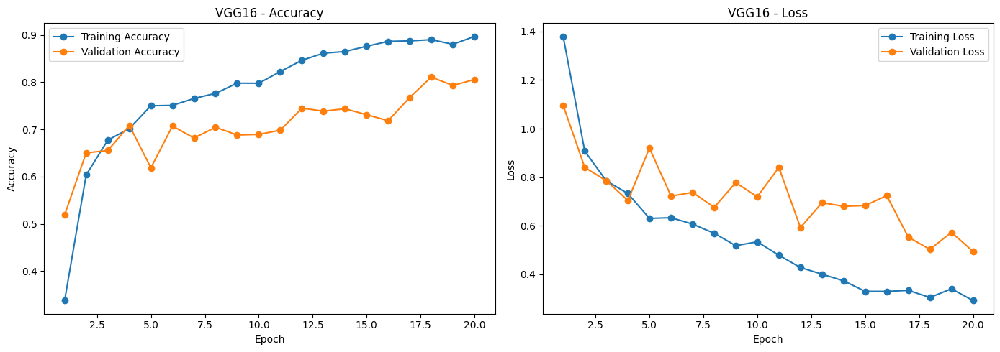

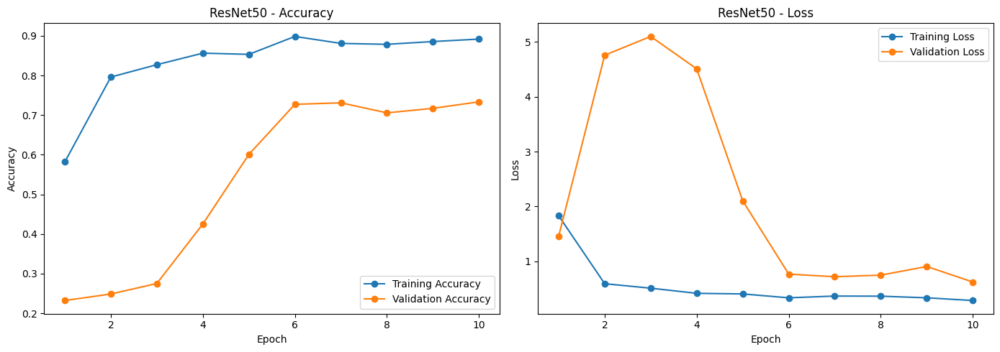

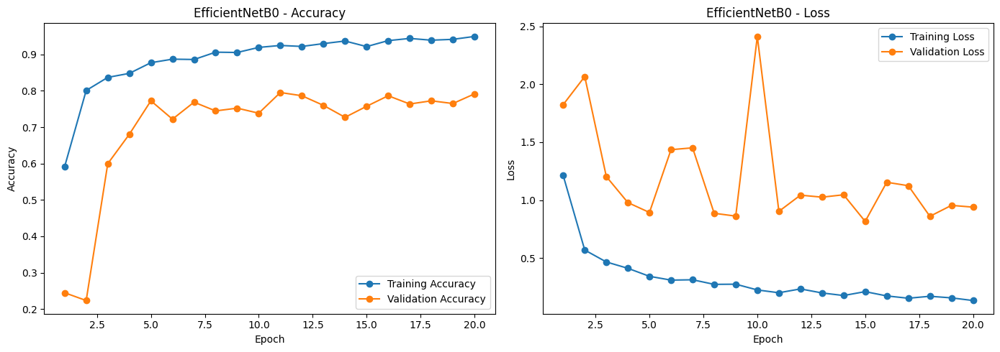

In [31]:
import matplotlib.pyplot as plt

# Data for VGG16
epochs_vgg = list(range(1, 21))
accuracy_vgg = [0.3378, 0.6037, 0.6771, 0.7018, 0.7500, 0.7508, 0.7654, 0.7763, 0.7978,
                 0.7976, 0.8224, 0.8462, 0.8612, 0.8648, 0.8759, 0.8863, 0.8873,
                 0.8899, 0.8801, 0.8967]
val_accuracy_vgg = [0.5189, 0.6503, 0.6553, 0.7083, 0.6187, 0.7071, 0.6818, 0.7045,
                    0.6881, 0.6894, 0.6982, 0.7449, 0.7386, 0.7437, 0.7311,
                    0.7184, 0.7677, 0.8106, 0.7929, 0.8056]
loss_vgg = [1.3796, 0.9073, 0.7851, 0.7326, 0.6305, 0.6332, 0.6069, 0.5691,
            0.5181, 0.5339, 0.4787, 0.4280, 0.4008, 0.3734, 0.3301,
            0.3298, 0.3341, 0.3048, 0.3405, 0.2922]
val_loss_vgg = [1.0958, 0.8402, 0.7855, 0.7042, 0.9199, 0.7222, 0.7375, 0.6759,
                0.7774, 0.7195, 0.8404, 0.5926, 0.6952, 0.6802, 0.6834,
                0.7239, 0.5533, 0.5030, 0.5727, 0.4946]

# Data for ResNet50
epochs_resnet = list(range(1, 11))
accuracy_resnet = [0.5819, 0.7961, 0.8273, 0.8564, 0.8534, 0.8986, 0.8810, 0.8787,
                   0.8857, 0.8919]
val_accuracy_resnet = [0.2323, 0.2487, 0.2753, 0.4255, 0.6010, 0.7273, 0.7311,
                       0.7058, 0.7172, 0.7336]
loss_resnet = [1.8290, 0.5894, 0.5077, 0.4141, 0.4026, 0.3322, 0.3641, 0.3618,
               0.3322, 0.2826]
val_loss_resnet = [1.4559, 4.7585, 5.1012, 4.5092, 2.1008, 0.7641, 0.7172,
                   0.7456, 0.9038, 0.6202]

# Data for EfficientNet
epochs_effnet = list(range(1, 21))
accuracy_effnet = [0.5915, 0.8011, 0.8371, 0.8481, 0.8775, 0.8872, 0.8863,
                   0.9064, 0.9056, 0.9195, 0.9249, 0.9222, 0.9300,
                   0.9371, 0.9218, 0.9382, 0.9442, 0.9394, 0.9417, 0.9497]
val_accuracy_effnet = [0.2449, 0.2235, 0.5997, 0.6806, 0.7727, 0.7222, 0.7689,
                       0.7449, 0.7525, 0.7386, 0.7955, 0.7866, 0.7601,
                       0.7273, 0.7576, 0.7866, 0.7639, 0.7727, 0.7652, 0.7917]
loss_effnet = [1.2132, 0.5685, 0.4655, 0.4107, 0.3415, 0.3086, 0.3116,
                0.2720, 0.2734, 0.2237, 0.1994, 0.2326, 0.1977,
                0.1755, 0.2091, 0.1720, 0.1521, 0.1690, 0.1552, 0.1323]
val_loss_effnet = [1.8246, 2.0676, 1.2036, 0.9785, 0.8932, 1.4357, 1.4516,
                   0.8861, 0.8617, 2.4141, 0.9025, 1.0428, 1.0253,
                   1.0459, 0.8160, 1.1541, 1.1244, 0.8598, 0.9545, 0.9392]

# Function to plot history
def plot_model_history(epochs, accuracy, val_accuracy, loss, val_loss, model_name):
    plt.figure(figsize=(14, 5))

    # Plot Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(epochs, accuracy, label='Training Accuracy', marker='o')
    plt.plot(epochs, val_accuracy, label='Validation Accuracy', marker='o')
    plt.title(f'{model_name} - Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot Loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, label='Training Loss', marker='o')
    plt.plot(epochs, val_loss, label='Validation Loss', marker='o')
    plt.title(f'{model_name} - Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Plotting each model's history
plot_model_history(epochs_vgg, accuracy_vgg, val_accuracy_vgg, loss_vgg, val_loss_vgg, "VGG16")
plot_model_history(epochs_resnet, accuracy_resnet, val_accuracy_resnet, loss_resnet, val_loss_resnet, "ResNet50")
plot_model_history(epochs_effnet, accuracy_effnet, val_accuracy_effnet, loss_effnet, val_loss_effnet, "EfficientNetB0")


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


17/17 ━━━━━━━━━━━━━━━━━━━━ 111s 7s/step
17/17 ━━━━━━━━━━━━━━━━━━━━ 9s 347ms/step
17/17 ━━━━━━━━━━━━━━━━━━━━ 14s 564ms/step


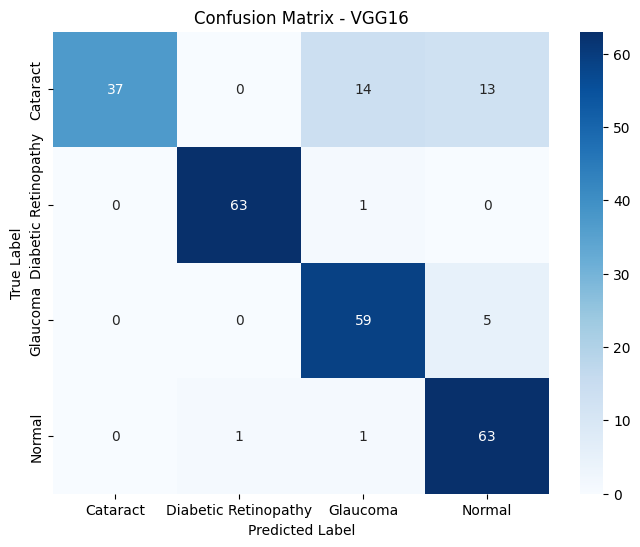

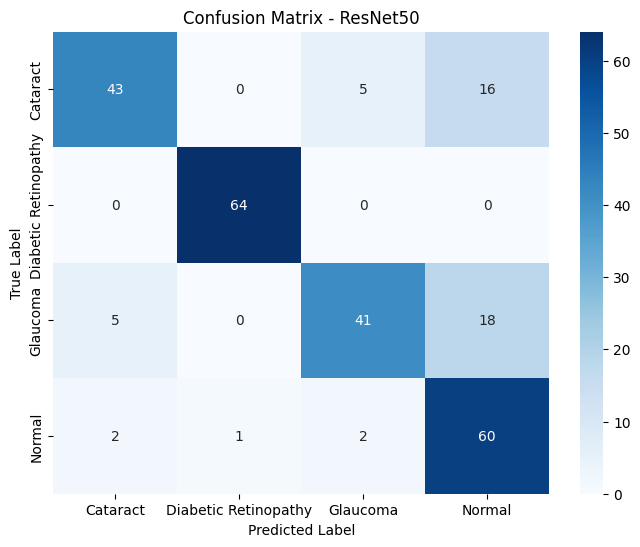

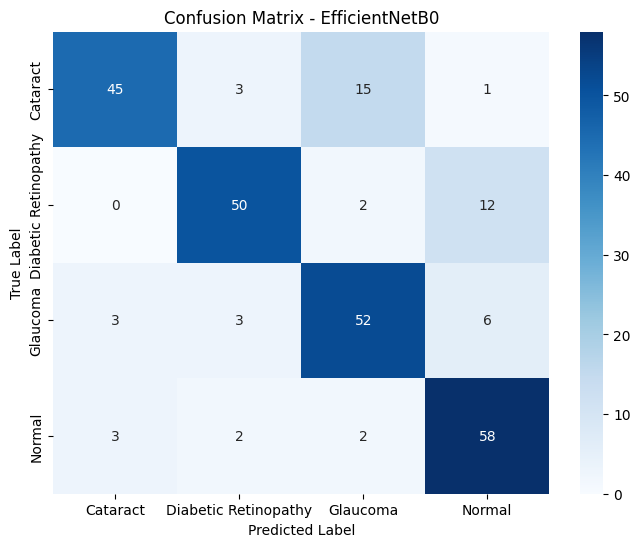

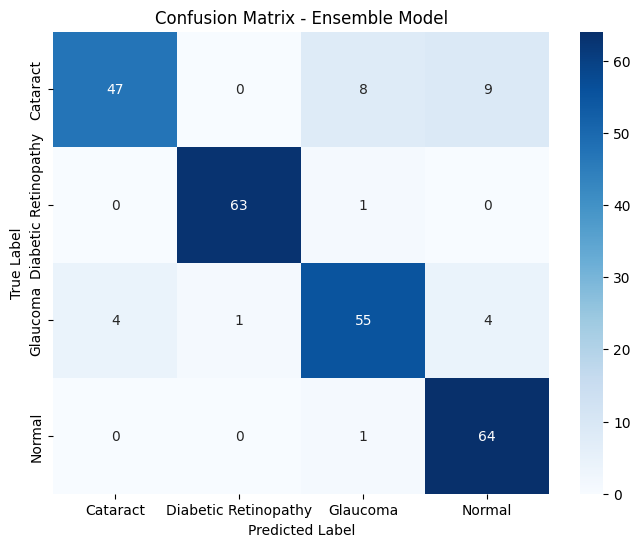

Classification Report - VGG16
                      precision    recall  f1-score   support

            Cataract       1.00      0.58      0.73        64
Diabetic Retinopathy       0.98      0.98      0.98        64
            Glaucoma       0.79      0.92      0.85        64
              Normal       0.78      0.97      0.86        65

            accuracy                           0.86       257
           macro avg       0.89      0.86      0.86       257
        weighted avg       0.89      0.86      0.86       257

Classification Report - ResNet50
                      precision    recall  f1-score   support

            Cataract       0.86      0.67      0.75        64
Diabetic Retinopathy       0.98      1.00      0.99        64
            Glaucoma       0.85      0.64      0.73        64
              Normal       0.64      0.92      0.75        65

            accuracy                           0.81       257
           macro avg       0.83      0.81      0.81       257
  

In [32]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have the following:
# y_true: true labels from your test dataset
# y_pred_vgg: predictions from VGG16
# y_pred_resnet: predictions from ResNet50
# y_pred_effnet: predictions from EfficientNetB0

# Example: Replace these with actual predictions and true labels
y_true = test_generator.classes  # True labels from the test set

# Get predictions from each model
y_pred_vgg = model_vgg.predict(test_generator)
y_pred_resnet = model_resnet.predict(test_generator)
y_pred_effnet = model_effnet.predict(test_generator)

# Convert predictions to class labels
y_pred_classes_vgg = np.argmax(y_pred_vgg, axis=1)
y_pred_classes_resnet = np.argmax(y_pred_resnet, axis=1)
y_pred_classes_effnet = np.argmax(y_pred_effnet, axis=1)

# Combine predictions using majority vote for ensemble prediction
y_pred_ensemble = np.array([np.argmax(np.bincount([p1, p2, p3]))
                             for p1, p2, p3 in zip(y_pred_classes_vgg, y_pred_classes_resnet, y_pred_classes_effnet)])

# Function to plot confusion matrix
def plot_confusion_matrix(y_true, y_pred, model_name):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=test_generator.class_indices.keys(),
                yticklabels=test_generator.class_indices.keys())
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title(f'Confusion Matrix - {model_name}')
    plt.show()

# Plot confusion matrices for each model
plot_confusion_matrix(y_true, y_pred_classes_vgg, "VGG16")
plot_confusion_matrix(y_true, y_pred_classes_resnet, "ResNet50")
plot_confusion_matrix(y_true, y_pred_classes_effnet, "EfficientNetB0")

# Plot confusion matrix for ensemble model
plot_confusion_matrix(y_true, y_pred_ensemble, "Ensemble Model")

# Optional: Print classification reports for each model
print("Classification Report - VGG16")
print(classification_report(y_true, y_pred_classes_vgg, target_names=test_generator.class_indices.keys()))

print("Classification Report - ResNet50")
print(classification_report(y_true, y_pred_classes_resnet, target_names=test_generator.class_indices.keys()))

print("Classification Report - EfficientNetB0")
print(classification_report(y_true, y_pred_classes_effnet, target_names=test_generator.class_indices.keys()))

print("Classification Report - Ensemble Model")
print(classification_report(y_true, y_pred_ensemble, target_names=test_generator.class_indices.keys()))


Found 258 images belonging to 4 classes.


Confusion Matrix:
[[48  1 12  3]
 [ 0 64  0  0]
 [ 2  1 57  4]
 [ 0  0  1 65]]

Classification Report:
                      precision    recall  f1-score   support

            Cataract       0.96      0.75      0.84        64
Diabetic Retinopathy       0.97      1.00      0.98        64
            Glaucoma       0.81      0.89      0.85        64
              Normal       0.90      0.98      0.94        66

            accuracy                           0.91       258
           macro avg       0.91      0.91      0.90       258
        weighted avg       0.91      0.91      0.91       258



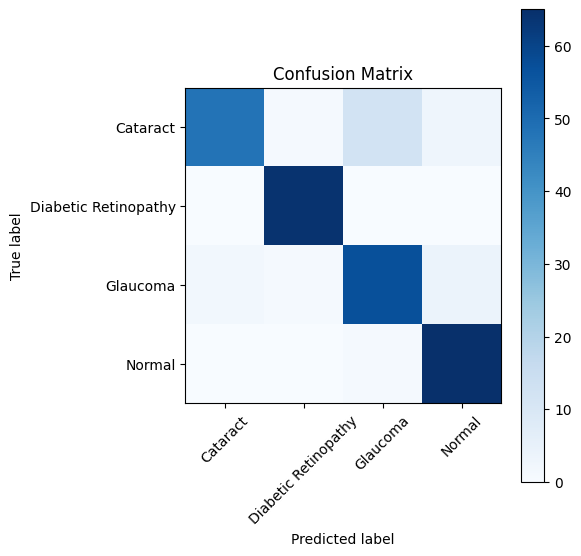

In [4]:
import numpy as np
from tensorflow.keras.models import load_model
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Precomputed F1-score weights
f1_scores_vgg = {'Cataract': 0.73, 'Diabetic Retinopathy': 0.98, 'Glaucoma': 0.85, 'Normal': 0.86}
f1_scores_resnet = {'Cataract': 0.75, 'Diabetic Retinopathy': 0.99, 'Glaucoma': 0.73, 'Normal': 0.75}
f1_scores_effnet = {'Cataract': 0.78, 'Diabetic Retinopathy': 0.82, 'Glaucoma': 0.77, 'Normal': 0.82}

# Precompute weights
class_labels = ['Cataract', 'Diabetic Retinopathy', 'Glaucoma', 'Normal']
f1_weights_vgg = np.array([f1_scores_vgg[label] for label in class_labels])
f1_weights_resnet = np.array([f1_scores_resnet[label] for label in class_labels])
f1_weights_effnet = np.array([f1_scores_effnet[label] for label in class_labels])

# Load the pre-trained models
model_vgg = load_model('model_vgg.h5')
model_resnet = load_model('model_resnet.h5')
model_effnet = load_model('model_effnet.h5')

# Set up the ImageDataGenerator for test data
test_datagen = ImageDataGenerator(rescale=1./255)
test_directory = test_dir  # Replace with the path to your test dataset
test_generator = test_datagen.flow_from_directory(
    test_directory,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False)

# Initialize true labels and final predictions
true_labels = []
final_predictions = []

# Process batch-wise for efficiency
for x_batch, y_batch in test_generator:
    # Get true labels for the batch
    true_labels.extend(np.argmax(y_batch, axis=1))
    
    # Get predictions from each model
    preds_vgg = model_vgg.predict(x_batch, verbose=0)
    preds_resnet = model_resnet.predict(x_batch, verbose=0)
    preds_effnet = model_effnet.predict(x_batch, verbose=0)

    # Apply batch-wise dynamic voting
    for i in range(len(x_batch)):
        # Get class predictions for the current image
        votes = (
            preds_vgg[i] * f1_weights_vgg + 
            preds_resnet[i] * f1_weights_resnet + 
            preds_effnet[i] * f1_weights_effnet
        )
        final_predictions.append(np.argmax(votes))  # Weighted majority voting
    
    # Break after one epoch of testing
    if test_generator.batch_index == 0:
        break

# Convert true labels and predictions to arrays
true_labels = np.array(true_labels)
final_predictions = np.array(final_predictions)

# Calculate confusion matrix
cm = confusion_matrix(true_labels, final_predictions)

# Print confusion matrix
print("Confusion Matrix:")
print(cm)

# Classification report for precision, recall, F1-score, and support
print("\nClassification Report:")
print(classification_report(true_labels, final_predictions, target_names=class_labels))

# Plot confusion matrix
def plot_confusion_matrix(cm, class_names):
    plt.figure(figsize=(6, 6))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names, rotation=45)
    plt.yticks(tick_marks, class_names)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()
    plt.show()

plot_confusion_matrix(cm, class_labels)


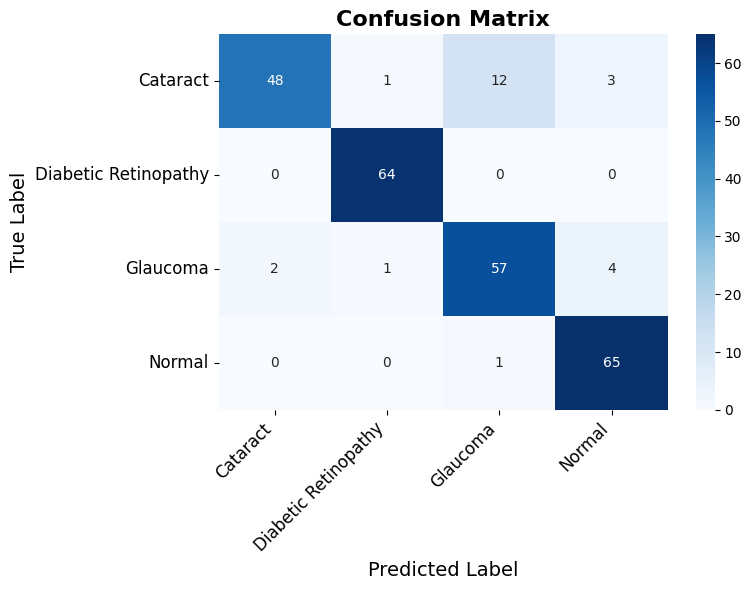

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Confusion matrix (example data, replace with your actual `cm`)
cm = np.array([[48,  1, 12,  3],
               [ 0, 64,  0,  0],
               [ 2,  1, 57,  4],
               [ 0,  0,  1, 65]])

# Class labels
class_labels = ['Cataract', 'Diabetic Retinopathy', 'Glaucoma', 'Normal']

def plot_enhanced_confusion_matrix(cm, class_names):
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    
    # Enhancing aesthetics
    plt.title("Confusion Matrix", fontsize=16, fontweight='bold')
    plt.xlabel("Predicted Label", fontsize=14)
    plt.ylabel("True Label", fontsize=14)
    plt.xticks(fontsize=12, rotation=45, ha="right")
    plt.yticks(fontsize=12, rotation=0)
    plt.tight_layout()
    plt.show()

# Call the enhanced plot function
plot_enhanced_confusion_matrix(cm, class_labels)


In [3]:
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt

# Precomputed F1-score weights
f1_scores_vgg = {'Cataract': 0.73, 'Diabetic Retinopathy': 0.98, 'Glaucoma': 0.85, 'Normal': 0.86}
f1_scores_resnet = {'Cataract': 0.75, 'Diabetic Retinopathy': 0.99, 'Glaucoma': 0.73, 'Normal': 0.75}
f1_scores_effnet = {'Cataract': 0.78, 'Diabetic Retinopathy': 0.82, 'Glaucoma': 0.77, 'Normal': 0.82}

# Class labels
class_labels = ['Cataract', 'Diabetic Retinopathy', 'Glaucoma', 'Normal']

# Precompute F1-score weights
f1_weights_vgg = np.array([f1_scores_vgg[label] for label in class_labels])
f1_weights_resnet = np.array([f1_scores_resnet[label] for label in class_labels])
f1_weights_effnet = np.array([f1_scores_effnet[label] for label in class_labels])

# Load pre-trained models
model_vgg = load_model('model_vgg.h5')
model_resnet = load_model('model_resnet.h5')
model_effnet = load_model('model_effnet.h5')

def preprocess_image(image_path, target_size=(224, 224)):
    """
    Preprocesses an image for model prediction.
    
    Args:
        image_path (str): Path to the image file.
        target_size (tuple): Target size for resizing the image.

    Returns:
        np.array: Preprocessed image array.
    """
    image = load_img(image_path, target_size=target_size)  # Load and resize image
    image = img_to_array(image)  # Convert to array
    image = image / 255.0  # Normalize pixel values
    return np.expand_dims(image, axis=0)  # Add batch dimension

def predict_images_with_details(image_paths, actual_labels):
    """
    Predicts the class of multiple images using an ensemble of models,
    and displays detailed prediction information.

    Args:
        image_paths (list): List of image file paths.
        actual_labels (list): List of actual class labels.

    Returns:
        None: Prints and plots detailed results for each image.
    """
    for idx, image_path in enumerate(image_paths):
        # Preprocess the image
        image = preprocess_image(image_path)
        
        # Get predictions from each model
        preds_vgg = model_vgg.predict(image, verbose=0)[0]
        preds_resnet = model_resnet.predict(image, verbose=0)[0]
        preds_effnet = model_effnet.predict(image, verbose=0)[0]
        
        # Apply weighted voting
        votes = (
            preds_vgg * f1_weights_vgg +
            preds_resnet * f1_weights_resnet +
            preds_effnet * f1_weights_effnet
        )
        
        # Determine the predicted class
        predicted_class = np.argmax(votes)
        predicted_label = class_labels[predicted_class]
        
        # Display results
        print(f"Image: {image_path}")
        print(f"Actual Label: {actual_labels[idx]}")
        print(f"VGG16 Predictions: {preds_vgg}")
        print(f"ResNet50 Predictions: {preds_resnet}")
        print(f"EfficientNetB0 Predictions: {preds_effnet}")
        print(f"Aggregated Votes: {votes}")
        print(f"Predicted Label: {predicted_label}\n")
        
        # Plot the image with labels
        img = load_img(image_path, target_size=(224, 224))
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Actual: {actual_labels[idx]} | Predicted: {predicted_label}")
        plt.show()

# Example: List of image paths and their actual labels
image_paths = [
    'testset/Cataract/_1_5346540.jpg','testset/Cataract/_39_9936846.jpg','testset/Cataract/_23_4636959.jpg','testset/Cataract/_40_3866061.jpg','testset/Diabetic Retinopathy/1008_left.jpeg','testset/Diabetic Retinopathy/102_left.jpeg', 'testset/Glaucoma/_13_8126689.jpg','testset/Glaucoma/_39_2691222.jpg','testset/Normal/2332_right.jpg','testset/Normal/695_right.jpg',
    'testset/Cataract/_37_7526265.jpg', 'testset/Cataract/_9_1244013.jpg','testset/Diabetic Retinopathy/1059_right.jpeg','testset/Diabetic Retinopathy/122_right.jpeg','testset/Glaucoma/_2_8820241.jpg','testset/Glaucoma/_38_3483571.jpg','testset/Glaucoma/_16_2996330.jpg','testset/Normal/2368_left.jpg','testset/Normal/939_right.jpg','testset/Normal/1060_right.jpg'
    
    # Replace with actual image paths
    ]
actual_labels = ['1 Cataract','2 Cataract','3 Cataract','4 Cataract','5 Diabetic Retinopathy','6 Diabetic Retinopathy','7 Glucoma','8 Glucoma','9 Normal','10 Normal',
                '11 Cataract','12 Cataract','13 Diabetic Retinopathy','14 Diabetic Retinopath','15 Glucoma','16 Glucoma','17 Glucoma','18 Normal','19 Normal', '20 Normal'
                ]  # Replace with actual labels

# Predict and display results
predict_images_with_details(image_paths, actual_labels)


KeyboardInterrupt: 

---
Processing Image 1/20: testset/Cataract/_1_5346540.jpg

VGG16 Predictions: [9.9361849e-01 3.1679592e-04 2.4144526e-03 3.6502457e-03]
ResNet50 Predictions: [9.9969316e-01 5.1339399e-09 6.3450216e-06 3.0057607e-04]
EfficientNetB0 Predictions: [9.9999928e-01 1.9057698e-14 1.8597925e-07 4.7254682e-07]

Aggregated Votes (Weighted Sum):
[2.2551e+00 3.0000e-04 2.1000e-03 3.4000e-03]

Aggregated Votes as Percentages:
               Class    Votes  Percentage (%)
            Cataract 2.255111           99.75
Diabetic Retinopathy 0.000310            0.01
            Glaucoma 0.002057            0.09
              Normal 0.003365            0.15

Final Predicted Class: Cataract
Actual Label: Cataract


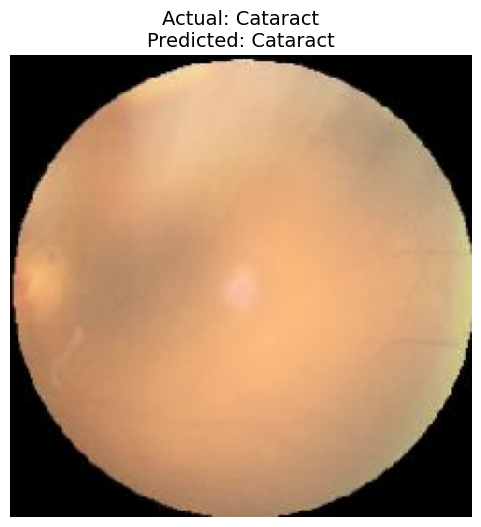

---
Processing Image 2/20: testset/Cataract/_39_9936846.jpg

VGG16 Predictions: [0.9623888  0.00100059 0.00354803 0.03306261]
ResNet50 Predictions: [9.5013392e-01 1.0837631e-04 1.8205980e-02 3.1551730e-02]
EfficientNetB0 Predictions: [9.9994993e-01 2.6510385e-09 2.3507229e-05 2.6538464e-05]

Aggregated Votes (Weighted Sum):
[2.1951e+00 1.1000e-03 1.6300e-02 5.2100e-02]

Aggregated Votes as Percentages:
               Class    Votes  Percentage (%)
            Cataract 2.195105           96.93
Diabetic Retinopathy 0.001088            0.05
            Glaucoma 0.016324            0.72
              Normal 0.052119            2.30

Final Predicted Class: Cataract
Actual Label: Cataract


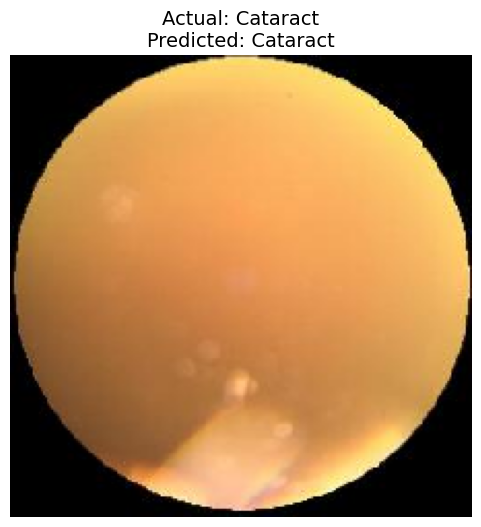

---
Processing Image 3/20: testset/Cataract/_23_4636959.jpg

VGG16 Predictions: [0.17894441 0.00828919 0.280604   0.53216237]
ResNet50 Predictions: [1.7582144e-01 7.2950628e-05 3.3707237e-01 4.8703331e-01]
EfficientNetB0 Predictions: [9.9999166e-01 3.5362260e-09 7.6368033e-06 6.6571562e-07]

Aggregated Votes (Weighted Sum):
[1.0425 0.0082 0.4846 0.8229]

Aggregated Votes as Percentages:
               Class    Votes  Percentage (%)
            Cataract 1.042489           44.21
Diabetic Retinopathy 0.008196            0.35
            Glaucoma 0.484582           20.55
              Normal 0.822935           34.90

Final Predicted Class: Cataract
Actual Label: Cataract


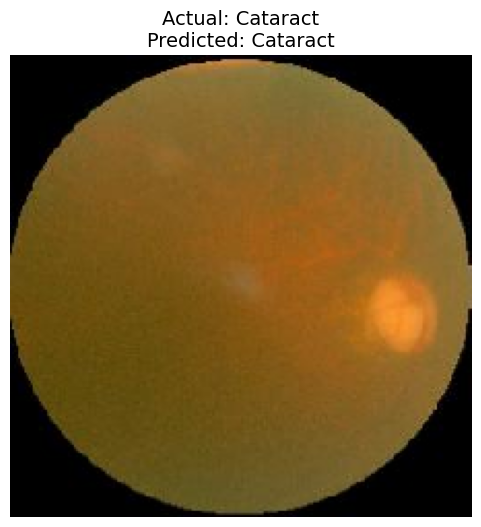

---
Processing Image 4/20: testset/Cataract/_40_3866061.jpg

VGG16 Predictions: [9.8122978e-01 7.6410337e-04 1.9093743e-03 1.6096840e-02]
ResNet50 Predictions: [9.9788660e-01 1.1392411e-09 7.6178607e-05 2.0372877e-03]
EfficientNetB0 Predictions: [1.0000000e+00 1.3508449e-18 4.7514458e-11 4.7794524e-10]

Aggregated Votes (Weighted Sum):
[2.2447e+00 7.0000e-04 1.7000e-03 1.5400e-02]

Aggregated Votes as Percentages:
               Class    Votes  Percentage (%)
            Cataract 2.244713           99.21
Diabetic Retinopathy 0.000749            0.03
            Glaucoma 0.001679            0.07
              Normal 0.015371            0.68

Final Predicted Class: Cataract
Actual Label: Cataract


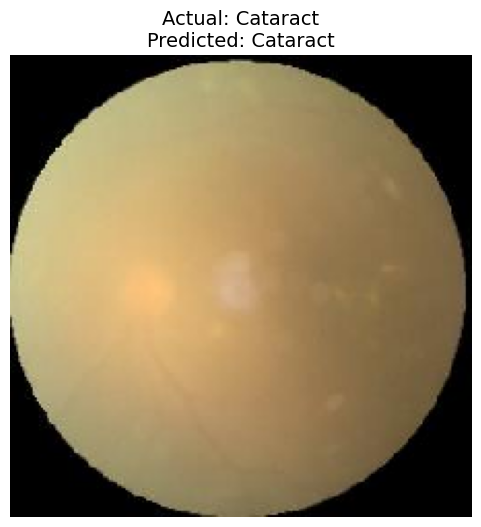

---
Processing Image 5/20: testset/Diabetic Retinopathy/1008_left.jpeg

VGG16 Predictions: [0.08362371 0.6639736  0.07102486 0.18137777]
ResNet50 Predictions: [0.12054913 0.7554319  0.0116253  0.11239371]
EfficientNetB0 Predictions: [2.0049189e-05 1.1790990e-01 3.6107488e-02 8.4596246e-01]

Aggregated Votes (Weighted Sum):
[0.1515 1.4953 0.0967 0.934 ]

Aggregated Votes as Percentages:
               Class    Votes  Percentage (%)
            Cataract 0.151473            5.66
Diabetic Retinopathy 1.495258           55.85
            Glaucoma 0.096660            3.61
              Normal 0.933969           34.88

Final Predicted Class: Diabetic Retinopathy
Actual Label: Diabetic Retinopathy


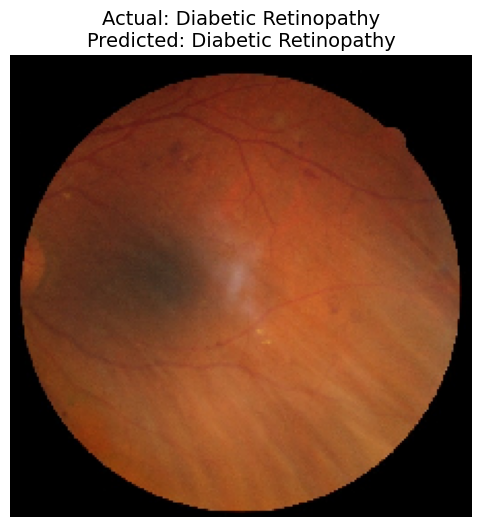

---
Processing Image 6/20: testset/Diabetic Retinopathy/102_left.jpeg

VGG16 Predictions: [8.6026049e-08 9.9979395e-01 3.1423566e-05 1.7457861e-04]
ResNet50 Predictions: [2.4953713e-11 9.9999917e-01 6.4661428e-08 6.5683753e-07]
EfficientNetB0 Predictions: [7.8491914e-11 9.9997020e-01 4.0526756e-06 2.5746043e-05]

Aggregated Votes (Weighted Sum):
[0.0000e+00 2.7898e+00 0.0000e+00 2.0000e-04]

Aggregated Votes as Percentages:
               Class        Votes  Percentage (%)
            Cataract 6.287895e-08            0.00
Diabetic Retinopathy 2.789773e+00           99.99
            Glaucoma 2.987779e-05            0.00
              Normal 1.717420e-04            0.01

Final Predicted Class: Diabetic Retinopathy
Actual Label: Diabetic Retinopathy


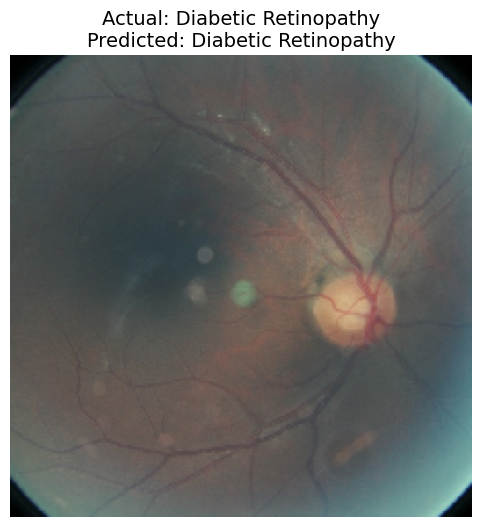

---
Processing Image 7/20: testset/Glaucoma/_13_8126689.jpg

VGG16 Predictions: [8.5692882e-05 2.2510476e-05 9.9816930e-01 1.7225128e-03]
ResNet50 Predictions: [1.1159860e-03 2.7377970e-05 6.7213547e-01 3.2672125e-01]
EfficientNetB0 Predictions: [6.3563185e-08 2.9631120e-10 9.9998713e-01 1.2742892e-05]

Aggregated Votes (Weighted Sum):
[9.0000e-04 0.0000e+00 2.1091e+00 2.4650e-01]

Aggregated Votes as Percentages:
               Class    Votes  Percentage (%)
            Cataract 0.000900            0.04
Diabetic Retinopathy 0.000049            0.00
            Glaucoma 2.109093           89.50
              Normal 0.246533           10.46

Final Predicted Class: Glaucoma
Actual Label: Glaucoma


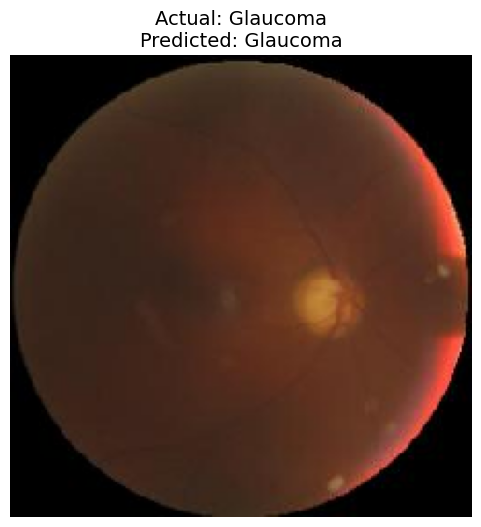

---
Processing Image 8/20: testset/Glaucoma/_39_2691222.jpg

VGG16 Predictions: [4.6171519e-04 1.6097885e-03 7.5653946e-01 2.4138895e-01]
ResNet50 Predictions: [2.2015735e-03 4.7270954e-05 5.5821800e-01 4.3953308e-01]
EfficientNetB0 Predictions: [9.4951737e-08 1.3957614e-09 9.7933298e-01 2.0666841e-02]

Aggregated Votes (Weighted Sum):
[2.0000e-03 1.6000e-03 1.8046e+00 5.5420e-01]

Aggregated Votes as Percentages:
               Class    Votes  Percentage (%)
            Cataract 0.001988            0.08
Diabetic Retinopathy 0.001624            0.07
            Glaucoma 1.804644           76.39
              Normal 0.554191           23.46

Final Predicted Class: Glaucoma
Actual Label: Glaucoma


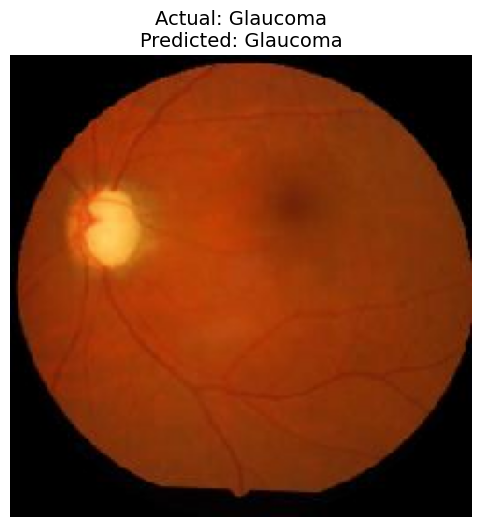

---
Processing Image 9/20: testset/Normal/2332_right.jpg

VGG16 Predictions: [0.05029979 0.0018125  0.02648321 0.92140454]
ResNet50 Predictions: [4.3790928e-01 1.1964340e-06 2.5198389e-02 5.3689110e-01]
EfficientNetB0 Predictions: [9.9749642e-04 1.7479431e-06 5.1624053e-08 9.9900073e-01]

Aggregated Votes (Weighted Sum):
[3.6590e-01 1.8000e-03 4.0900e-02 2.0143e+00]

Aggregated Votes as Percentages:
               Class    Votes  Percentage (%)
            Cataract 0.365929           15.10
Diabetic Retinopathy 0.001779            0.07
            Glaucoma 0.040906            1.69
              Normal 2.014257           83.14

Final Predicted Class: Normal
Actual Label: Normal


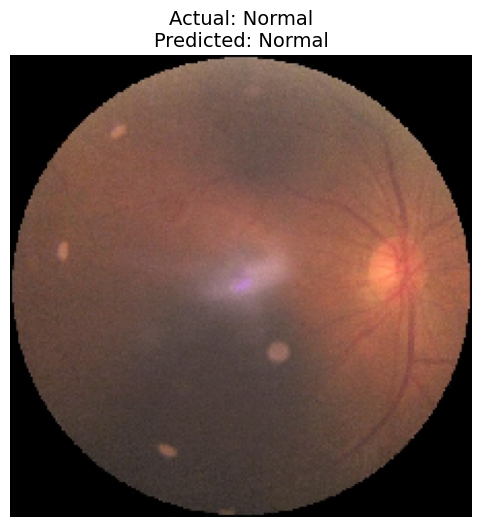

---
Processing Image 10/20: testset/Normal/695_right.jpg

VGG16 Predictions: [1.1946607e-04 2.8764110e-02 4.1828486e-03 9.6693355e-01]
ResNet50 Predictions: [5.5928910e-03 4.7074471e-05 4.5410525e-03 9.8981899e-01]
EfficientNetB0 Predictions: [4.4828289e-07 2.5117714e-02 9.1962908e-09 9.7488189e-01]

Aggregated Votes (Weighted Sum):
[0.0043 0.0488 0.0069 2.3733]

Aggregated Votes as Percentages:
               Class    Votes  Percentage (%)
            Cataract 0.004282            0.18
Diabetic Retinopathy 0.048832            2.01
            Glaucoma 0.006870            0.28
              Normal 2.373330           97.53

Final Predicted Class: Normal
Actual Label: Normal


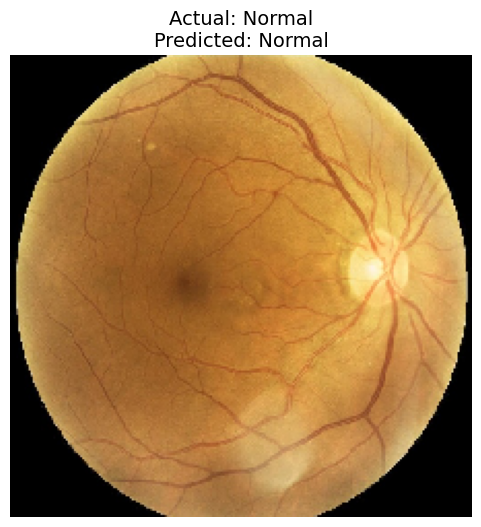

---
Processing Image 11/20: testset/Cataract/_37_7526265.jpg

VGG16 Predictions: [9.8556560e-01 5.1747309e-04 1.2654105e-03 1.2651641e-02]
ResNet50 Predictions: [9.9902272e-01 5.3053201e-10 1.2950994e-04 8.4783154e-04]
EfficientNetB0 Predictions: [9.9999070e-01 3.1054277e-13 8.9634077e-06 3.2463024e-07]

Aggregated Votes (Weighted Sum):
[2.2487e+00 5.0000e-04 1.2000e-03 1.1500e-02]

Aggregated Votes as Percentages:
               Class    Votes  Percentage (%)
            Cataract 2.248723           99.42
Diabetic Retinopathy 0.000507            0.02
            Glaucoma 0.001177            0.05
              Normal 0.011517            0.51

Final Predicted Class: Cataract
Actual Label: Cataract


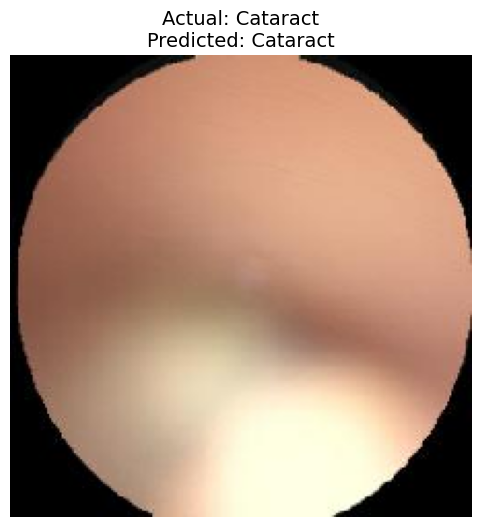

---
Processing Image 12/20: testset/Cataract/_9_1244013.jpg

VGG16 Predictions: [0.02858945 0.0061918  0.08663619 0.8785825 ]
ResNet50 Predictions: [4.4417921e-03 8.7547056e-07 3.3698961e-04 9.9522036e-01]
EfficientNetB0 Predictions: [1.4960887e-18 9.7616154e-01 5.9153734e-07 2.3837868e-02]

Aggregated Votes (Weighted Sum):
[0.0242 0.8065 0.0739 1.5215]

Aggregated Votes as Percentages:
               Class    Votes  Percentage (%)
            Cataract 0.024202            1.00
Diabetic Retinopathy 0.806521           33.24
            Glaucoma 0.073887            3.05
              Normal 1.521543           62.71

Final Predicted Class: Normal
Actual Label: Cataract


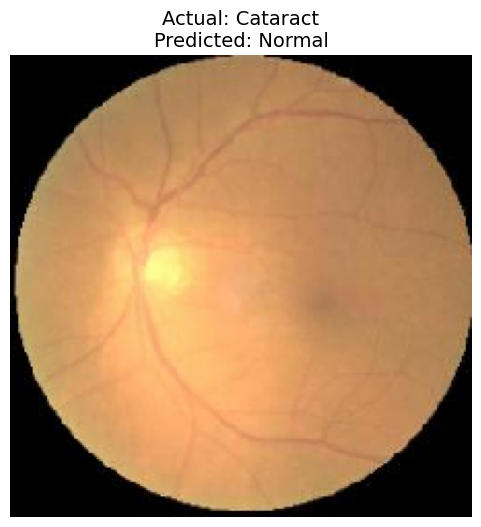

---
Processing Image 13/20: testset/Diabetic Retinopathy/1059_right.jpeg

VGG16 Predictions: [1.8329721e-06 9.9372452e-01 2.1420645e-04 6.0593570e-03]
ResNet50 Predictions: [1.5921886e-07 9.9813372e-01 1.2548799e-05 1.8536348e-03]
EfficientNetB0 Predictions: [3.4799173e-14 3.1609679e-06 1.5689469e-10 9.9999678e-01]

Aggregated Votes (Weighted Sum):
[0.000e+00 1.962e+00 2.000e-04 8.266e-01]

Aggregated Votes as Percentages:
               Class    Votes  Percentage (%)
            Cataract 0.000001            0.00
Diabetic Retinopathy 1.962005           70.35
            Glaucoma 0.000191            0.01
              Normal 0.826599           29.64

Final Predicted Class: Diabetic Retinopathy
Actual Label: Diabetic Retinopathy


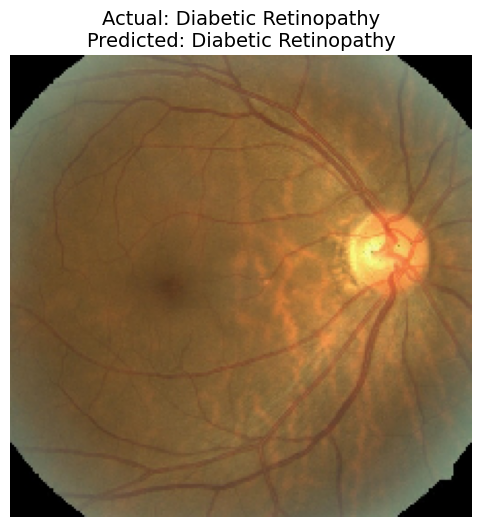

---
Processing Image 14/20: testset/Diabetic Retinopathy/122_right.jpeg

VGG16 Predictions: [4.4243850e-05 9.9792767e-01 1.0251242e-03 1.0029256e-03]
ResNet50 Predictions: [5.7606451e-04 9.9600983e-01 1.4596479e-04 3.2681047e-03]
EfficientNetB0 Predictions: [5.2379759e-14 9.9999928e-01 1.5982595e-11 7.1204124e-07]

Aggregated Votes (Weighted Sum):
[5.000e-04 2.784e+00 1.000e-03 3.300e-03]

Aggregated Votes as Percentages:
               Class    Votes  Percentage (%)
            Cataract 0.000464            0.02
Diabetic Retinopathy 2.784018           99.83
            Glaucoma 0.000978            0.04
              Normal 0.003314            0.12

Final Predicted Class: Diabetic Retinopathy
Actual Label: Diabetic Retinopathy


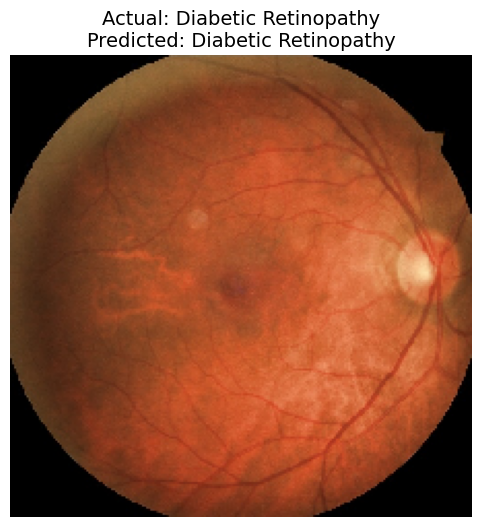

---
Processing Image 15/20: testset/Glaucoma/_2_8820241.jpg

VGG16 Predictions: [5.73426136e-04 6.12532429e-04 8.76287103e-01 1.22526966e-01]
ResNet50 Predictions: [7.425923e-04 6.690464e-06 8.589068e-01 1.403438e-01]
EfficientNetB0 Predictions: [3.2290298e-08 1.4785981e-07 9.9980348e-01 1.9634298e-04]

Aggregated Votes (Weighted Sum):
[1.0000e-03 6.0000e-04 2.1417e+00 2.1080e-01]

Aggregated Votes as Percentages:
               Class    Votes  Percentage (%)
            Cataract 0.000976            0.04
Diabetic Retinopathy 0.000607            0.03
            Glaucoma 2.141695           90.98
              Normal 0.210792            8.95

Final Predicted Class: Glaucoma
Actual Label: Glaucoma


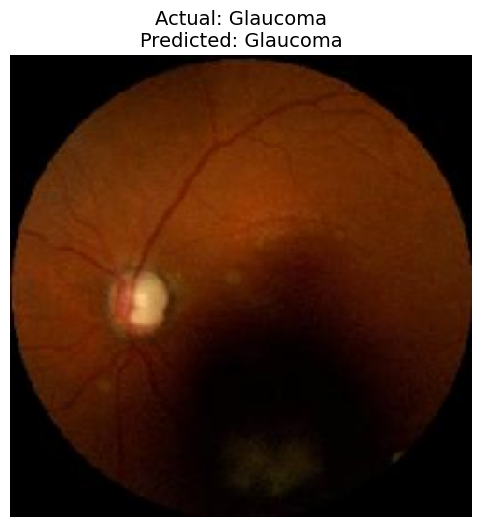

---
Processing Image 16/20: testset/Glaucoma/_38_3483571.jpg

VGG16 Predictions: [2.91073957e-06 1.04828214e-04 8.51553619e-01 1.48338631e-01]
ResNet50 Predictions: [2.7981054e-04 1.6067241e-05 5.2003729e-01 4.7966686e-01]
EfficientNetB0 Predictions: [1.6885464e-15 3.6147622e-15 9.9999940e-01 5.7581582e-07]

Aggregated Votes (Weighted Sum):
[2.0000e-04 1.0000e-04 1.8734e+00 4.8730e-01]

Aggregated Votes as Percentages:
               Class    Votes  Percentage (%)
            Cataract 0.000212            0.01
Diabetic Retinopathy 0.000119            0.01
            Glaucoma 1.873447           79.35
              Normal 0.487322           20.64

Final Predicted Class: Glaucoma
Actual Label: Glaucoma


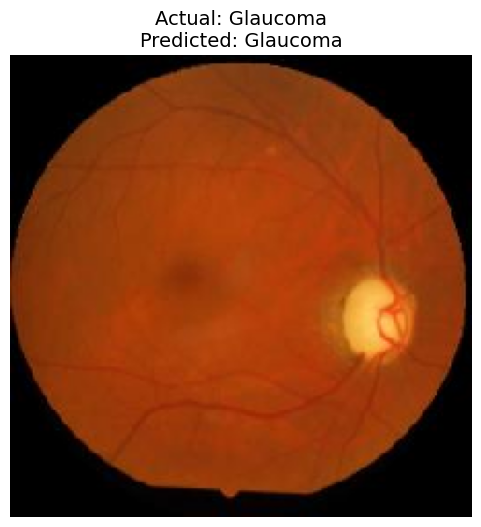

---
Processing Image 17/20: testset/Glaucoma/_16_2996330.jpg

VGG16 Predictions: [0.00113617 0.00181443 0.69399834 0.30305105]
ResNet50 Predictions: [1.8958880e-02 5.8370733e-05 3.4538642e-01 6.3559645e-01]
EfficientNetB0 Predictions: [1.1507978e-26 1.0000000e+00 6.4217569e-11 9.8301697e-14]

Aggregated Votes (Weighted Sum):
[0.015  0.8218 0.842  0.7373]

Aggregated Votes as Percentages:
               Class    Votes  Percentage (%)
            Cataract 0.015049            0.62
Diabetic Retinopathy 0.821836           34.01
            Glaucoma 0.842031           34.85
              Normal 0.737321           30.52

Final Predicted Class: Glaucoma
Actual Label: Glaucoma


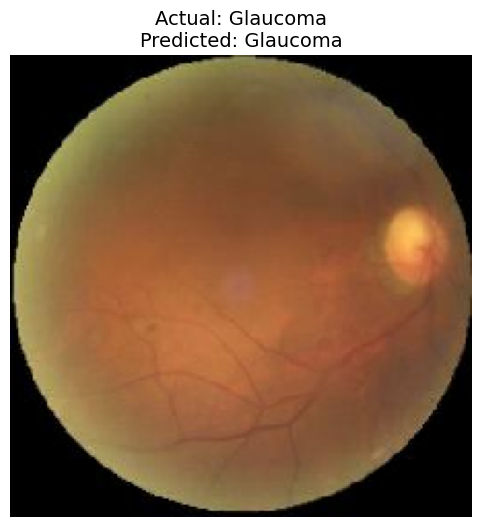

---
Processing Image 18/20: testset/Normal/2368_left.jpg

VGG16 Predictions: [0.00221703 0.02978727 0.03248143 0.9355142 ]
ResNet50 Predictions: [6.576234e-05 4.762037e-06 5.781689e-02 9.421127e-01]
EfficientNetB0 Predictions: [1.6769683e-11 2.5680213e-04 1.7698321e-03 9.9797326e-01]

Aggregated Votes (Weighted Sum):
[1.7000e-03 2.9400e-02 7.1200e-02 2.3295e+00]

Aggregated Votes as Percentages:
               Class    Votes  Percentage (%)
            Cataract 0.001668            0.07
Diabetic Retinopathy 0.029407            1.21
            Glaucoma 0.071178            2.93
              Normal 2.329465           95.80

Final Predicted Class: Normal
Actual Label: Normal


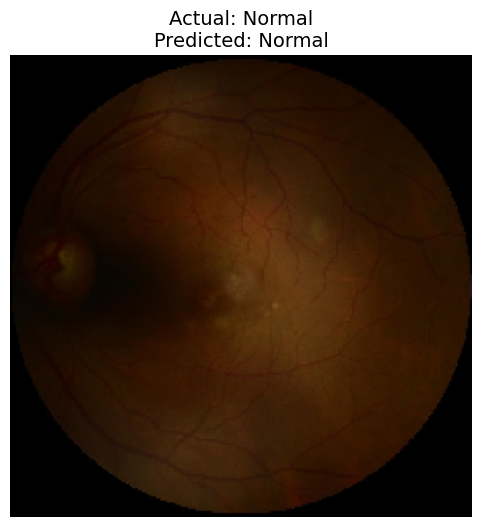

---
Processing Image 19/20: testset/Normal/939_right.jpg

VGG16 Predictions: [0.00473849 0.02062489 0.16945726 0.8051794 ]
ResNet50 Predictions: [1.9829009e-04 1.0171118e-06 2.0134695e-01 7.9845369e-01]
EfficientNetB0 Predictions: [4.4153830e-13 2.5809783e-09 1.7709965e-05 9.9998224e-01]

Aggregated Votes (Weighted Sum):
[0.0036 0.0202 0.291  2.1113]

Aggregated Votes as Percentages:
               Class    Votes  Percentage (%)
            Cataract 0.003608            0.15
Diabetic Retinopathy 0.020213            0.83
            Glaucoma 0.291036           12.00
              Normal 2.111280           87.02

Final Predicted Class: Normal
Actual Label: Normal


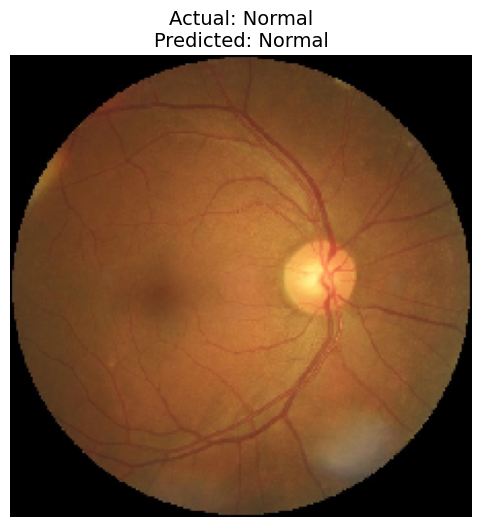

---
Processing Image 20/20: testset/Normal/1060_right.jpg

VGG16 Predictions: [1.6893222e-04 4.8056129e-02 9.4968811e-02 8.5680616e-01]
ResNet50 Predictions: [1.1049316e-02 8.5018364e-06 1.8397948e-01 8.0496269e-01]
EfficientNetB0 Predictions: [2.7954422e-11 2.9484312e-05 4.3223432e-04 9.9953830e-01]

Aggregated Votes (Weighted Sum):
[0.0084 0.0471 0.2154 2.1602]

Aggregated Votes as Percentages:
               Class    Votes  Percentage (%)
            Cataract 0.008410            0.35
Diabetic Retinopathy 0.047128            1.94
            Glaucoma 0.215361            8.86
              Normal 2.160197           88.86

Final Predicted Class: Normal
Actual Label: Normal


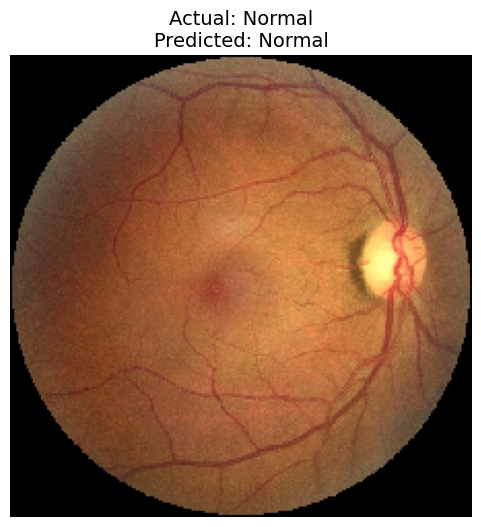

In [13]:
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt
import pandas as pd

# Precomputed F1-score weights
f1_scores_vgg = {'Cataract': 0.73, 'Diabetic Retinopathy': 0.98, 'Glaucoma': 0.85, 'Normal': 0.86}
f1_scores_resnet = {'Cataract': 0.75, 'Diabetic Retinopathy': 0.99, 'Glaucoma': 0.73, 'Normal': 0.75}
f1_scores_effnet = {'Cataract': 0.78, 'Diabetic Retinopathy': 0.82, 'Glaucoma': 0.77, 'Normal': 0.82}

# Class labels
class_labels = ['Cataract', 'Diabetic Retinopathy', 'Glaucoma', 'Normal']

# Precompute F1-score weights
f1_weights_vgg = np.array([f1_scores_vgg[label] for label in class_labels])
f1_weights_resnet = np.array([f1_scores_resnet[label] for label in class_labels])
f1_weights_effnet = np.array([f1_scores_effnet[label] for label in class_labels])

# Load pre-trained models
model_vgg = load_model('model_vgg.h5')
model_resnet = load_model('model_resnet.h5')
model_effnet = load_model('model_effnet.h5')

def preprocess_image(image_path, target_size=(224, 224)):
    """
    Preprocesses an image for model prediction.
    
    Args:
        image_path (str): Path to the image file.
        target_size (tuple): Target size for resizing the image.

    Returns:
        np.array: Preprocessed image array.
    """
    image = load_img(image_path, target_size=target_size)  # Load and resize image
    image = img_to_array(image)  # Convert to array
    image = image / 255.0  # Normalize pixel values
    return np.expand_dims(image, axis=0)  # Add batch dimension

def predict_images_with_details(image_paths, actual_labels):
    """
    Predicts the class of multiple images using an ensemble of models,
    and displays detailed prediction information.

    Args:
        image_paths (list): List of image file paths.
        actual_labels (list): List of actual class labels.

    Returns:
        None: Prints and plots detailed results for each image.
    """
    for idx, image_path in enumerate(image_paths):
        print(f"---\nProcessing Image {idx + 1}/{len(image_paths)}: {image_path}")
        
        # Preprocess the image
        image = preprocess_image(image_path)
        
        # Get predictions from each model
        preds_vgg = model_vgg.predict(image, verbose=0)[0]
        preds_resnet = model_resnet.predict(image, verbose=0)[0]
        preds_effnet = model_effnet.predict(image, verbose=0)[0]
        
        # Print individual model predictions
        print(f"\nVGG16 Predictions: {preds_vgg}")
        print(f"ResNet50 Predictions: {preds_resnet}")
        print(f"EfficientNetB0 Predictions: {preds_effnet}")
        
        # Apply weighted voting
        votes = (
            preds_vgg * f1_weights_vgg +
            preds_resnet * f1_weights_resnet +
            preds_effnet * f1_weights_effnet
        )
        
        # Normalize votes to get percentages
        votes_percentage = (votes / votes.sum()) * 100
        
        # Create a DataFrame for better visualization of votes
        votes_df = pd.DataFrame({
            'Class': class_labels,
            'Votes': votes,
            'Percentage (%)': np.round(votes_percentage, 2)
        })
        
        # Determine the predicted class
        predicted_class = np.argmax(votes)
        predicted_label = class_labels[predicted_class]
        
        # Display aggregated votes
        print("\nAggregated Votes (Weighted Sum):")
        print(np.round(votes, 4))
        print("\nAggregated Votes as Percentages:")
        print(votes_df.to_string(index=False))
        
        # Print the final prediction
        print(f"\nFinal Predicted Class: {predicted_label}")
        print(f"Actual Label: {actual_labels[idx]}")
        
        # Plot the image with labels
        img = load_img(image_path, target_size=(224, 224))
        plt.figure(figsize=(6, 6))
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Actual: {actual_labels[idx]}\nPredicted: {predicted_label}", fontsize=14)
        plt.show()

# Example: List of image paths and their actual labels
image_paths = [
    'testset/Cataract/_1_5346540.jpg',
    'testset/Cataract/_39_9936846.jpg',
    'testset/Cataract/_23_4636959.jpg',
    'testset/Cataract/_40_3866061.jpg',
    'testset/Diabetic Retinopathy/1008_left.jpeg',
    'testset/Diabetic Retinopathy/102_left.jpeg',
    'testset/Glaucoma/_13_8126689.jpg',
    'testset/Glaucoma/_39_2691222.jpg',
    'testset/Normal/2332_right.jpg',
    'testset/Normal/695_right.jpg',
    'testset/Cataract/_37_7526265.jpg',
    'testset/Cataract/_9_1244013.jpg',
    'testset/Diabetic Retinopathy/1059_right.jpeg',
    'testset/Diabetic Retinopathy/122_right.jpeg',
    'testset/Glaucoma/_2_8820241.jpg',
    'testset/Glaucoma/_38_3483571.jpg',
    'testset/Glaucoma/_16_2996330.jpg',
    'testset/Normal/2368_left.jpg',
    'testset/Normal/939_right.jpg',
    'testset/Normal/1060_right.jpg'
]
actual_labels = [
    'Cataract', 'Cataract', 'Cataract', 'Cataract',
    'Diabetic Retinopathy', 'Diabetic Retinopathy',
    'Glaucoma', 'Glaucoma',
    'Normal', 'Normal',
    'Cataract', 'Cataract',
    'Diabetic Retinopathy', 'Diabetic Retinopathy',
    'Glaucoma', 'Glaucoma', 'Glaucoma',
    'Normal', 'Normal', 'Normal'
]  # Ensure these labels correspond correctly to your image paths

# Predict and display results
predict_images_with_details(image_paths, actual_labels)


In [ ]:
#Classification Report for Individual Classes and Weighted Voting

Found 292 images belonging to 4 classes.

Classification Report for VGG16:
              precision    recall  f1-score   support

    Glaucoma       0.97      0.93      0.95        69
      Normal       0.93      0.97      0.95        72

    accuracy                           0.95       141
   macro avg       0.95      0.95      0.95       141
weighted avg       0.95      0.95      0.95       141


Classification Report for ResNet:
              precision    recall  f1-score   support

    Glaucoma       0.94      0.67      0.78        69
      Normal       0.75      0.96      0.84        72

    accuracy                           0.82       141
   macro avg       0.84      0.81      0.81       141
weighted avg       0.84      0.82      0.81       141


Classification Report for EfficientNet:
              precision    recall  f1-score   support

    Glaucoma       0.49      1.00      0.66        69
      Normal       0.00      0.00      0.00        72

    accuracy                   

C:\Users\PC\Desktop\CodingStuff\EyeDiseasePred\venv\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\PC\Desktop\CodingStuff\EyeDiseasePred\venv\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\PC\Desktop\CodingStuff\EyeDiseasePred\venv\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f

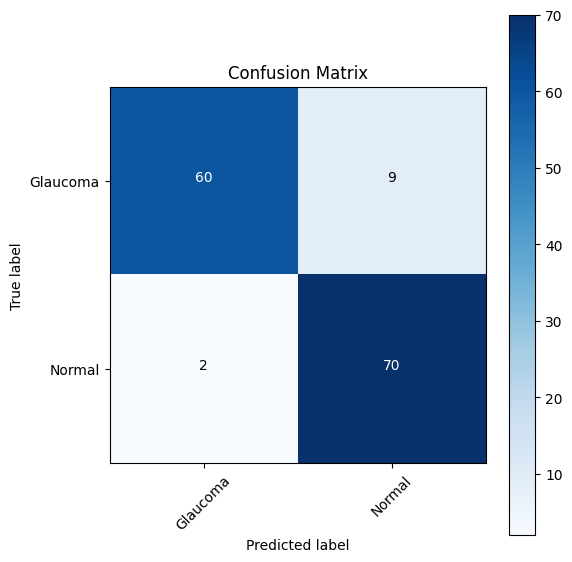

In [6]:
import numpy as np
from tensorflow.keras.models import load_model
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Precomputed F1-score weights for only Glaucoma and Normal
f1_scores_vgg = {'Glaucoma': 0.95, 'Normal': 0.95}
f1_scores_resnet = {'Glaucoma': 0.78, 'Normal': 0.84}
f1_scores_effnet = {'Glaucoma': 0.66, 'Normal': 0.00}

# Precompute weights
class_labels = ['Glaucoma', 'Normal']
f1_weights_vgg = np.array([f1_scores_vgg[label] for label in class_labels])
f1_weights_resnet = np.array([f1_scores_resnet[label] for label in class_labels])
f1_weights_effnet = np.array([f1_scores_effnet[label] for label in class_labels])

# Load the pre-trained models
model_vgg = load_model('model_vgg.h5')
model_resnet = load_model('model_resnet.h5')
model_effnet = load_model('model_effnet.h5')

# Set up the ImageDataGenerator for test data
test_datagen = ImageDataGenerator(rescale=1./255)
test_directory = test_dir  # Replace with the path to your test dataset
test_generator = test_datagen.flow_from_directory(
    test_directory,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False)

# Initialize true labels and predictions for each model
true_labels = []
predictions_vgg = []
predictions_resnet = []
predictions_effnet = []
final_predictions = []

# Map full class indices to only Glaucoma and Normal (assumes original class order)
class_map = {'Glaucoma': 2, 'Normal': 3}  # Update based on your directory's class mapping

# Process batch-wise for efficiency
for x_batch, y_batch in test_generator:
    for i in range(len(y_batch)):
        label_idx = np.argmax(y_batch[i])
        if label_idx in [class_map['Glaucoma'], class_map['Normal']]:
            true_labels.append(label_idx - class_map['Glaucoma'])  # Normalize to 0 (Glaucoma) and 1 (Normal)

            # Get predictions from each model
            preds_vgg = model_vgg.predict(np.expand_dims(x_batch[i], axis=0), verbose=0)[0]
            preds_resnet = model_resnet.predict(np.expand_dims(x_batch[i], axis=0), verbose=0)[0]
            preds_effnet = model_effnet.predict(np.expand_dims(x_batch[i], axis=0), verbose=0)[0]

            # Store predictions for each model
            predictions_vgg.append(np.argmax(preds_vgg[class_map['Glaucoma']:class_map['Normal'] + 1]))
            predictions_resnet.append(np.argmax(preds_resnet[class_map['Glaucoma']:class_map['Normal'] + 1]))
            predictions_effnet.append(np.argmax(preds_effnet[class_map['Glaucoma']:class_map['Normal'] + 1]))

            # Apply weighted voting for filtered classes
            votes = (
                preds_vgg[class_map['Glaucoma']:class_map['Normal'] + 1] * f1_weights_vgg +
                preds_resnet[class_map['Glaucoma']:class_map['Normal'] + 1] * f1_weights_resnet +
                preds_effnet[class_map['Glaucoma']:class_map['Normal'] + 1] * f1_weights_effnet
            )
            final_predictions.append(np.argmax(votes))
    
    # Break after one epoch of testing
    if test_generator.batch_index == 0:
        break

# Convert true labels and predictions to arrays
true_labels = np.array(true_labels)
predictions_vgg = np.array(predictions_vgg)
predictions_resnet = np.array(predictions_resnet)
predictions_effnet = np.array(predictions_effnet)
final_predictions = np.array(final_predictions)

# Print classification reports for each model
print("\nClassification Report for VGG16:")
print(classification_report(true_labels, predictions_vgg, target_names=class_labels))

print("\nClassification Report for ResNet:")
print(classification_report(true_labels, predictions_resnet, target_names=class_labels))

print("\nClassification Report for EfficientNet:")
print(classification_report(true_labels, predictions_effnet, target_names=class_labels))

# Calculate final confusion matrix
cm = confusion_matrix(true_labels, final_predictions)

# Print final classification report
print("\nFinal Classification Report (Weighted Voting):")
print(classification_report(true_labels, final_predictions, target_names=class_labels))

# Plot confusion matrix with numbers displayed
def plot_confusion_matrix(cm, class_names):
    plt.figure(figsize=(6, 6))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names, rotation=45)
    plt.yticks(tick_marks, class_names)

    # Add text annotations in squares
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            plt.text(j, i, format(cm[i, j], 'd'),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > cm.max() / 2 else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()
    plt.show()

plot_confusion_matrix(cm, class_labels)



Final Classification Report (Dynamic Weighted Voting):
              precision    recall  f1-score   support

    Glaucoma       0.97      0.93      0.95        69
      Normal       0.93      0.97      0.95        72

    accuracy                           0.95       141
   macro avg       0.95      0.95      0.95       141
weighted avg       0.95      0.95      0.95       141



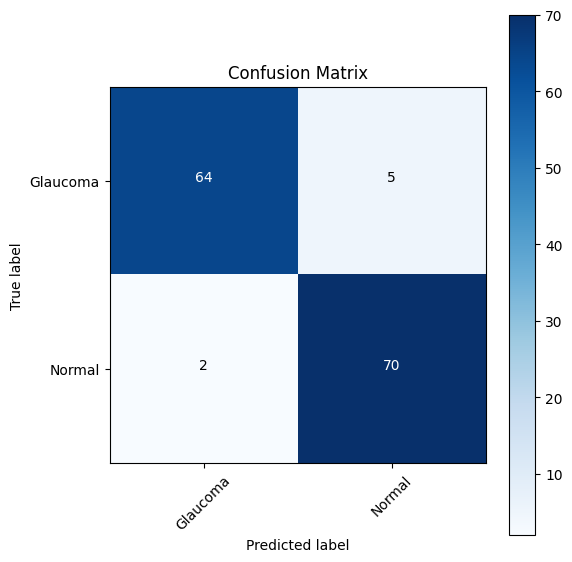

In [8]:
# Dynamic voting based on class-specific F1-scores
f1_scores = {
    "VGG16": {'Glaucoma': 0.95, 'Normal': 0.95},
    "ResNet": {'Glaucoma': 0.78, 'Normal': 0.84},
    "EffNet": {'Glaucoma': 0.66, 'Normal': 0.00}
}

# Convert F1-scores to class-specific weights
weights = {
    class_name: np.array([f1_scores["VGG16"][class_name], 
                          f1_scores["ResNet"][class_name], 
                          f1_scores["EffNet"][class_name]])
    for class_name in class_labels
}

# Normalize the weights for each class
normalized_weights = {
    class_name: class_weights / np.sum(class_weights)
    for class_name, class_weights in weights.items()
}

# Initialize true labels and final predictions
true_labels = []
final_predictions = []

# Process batch-wise for efficiency
for x_batch, y_batch in test_generator:
    for i in range(len(y_batch)):
        label_idx = np.argmax(y_batch[i])
        if label_idx in [class_map['Glaucoma'], class_map['Normal']]:
            true_labels.append(label_idx - class_map['Glaucoma'])  # Normalize to 0 (Glaucoma) and 1 (Normal)

            # Get predictions from each model
            preds_vgg = model_vgg.predict(np.expand_dims(x_batch[i], axis=0), verbose=0)[0]
            preds_resnet = model_resnet.predict(np.expand_dims(x_batch[i], axis=0), verbose=0)[0]
            preds_effnet = model_effnet.predict(np.expand_dims(x_batch[i], axis=0), verbose=0)[0]

            # Apply dynamic weighted voting
            votes = np.zeros(len(class_labels))
            for j, class_name in enumerate(class_labels):
                votes[j] = (
                    preds_vgg[class_map[class_name]] #* normalized_weights[class_name][0] +
                    #preds_resnet[class_map[class_name]] * normalized_weights[class_name][1] +
                    #preds_effnet[class_map[class_name]] * normalized_weights[class_name][2]
                )
            final_predictions.append(np.argmax(votes))
    
    # Break after one epoch of testing
    if test_generator.batch_index == 0:
        break

# Convert true labels and predictions to arrays
true_labels = np.array(true_labels)
final_predictions = np.array(final_predictions)

# Calculate confusion matrix
cm = confusion_matrix(true_labels, final_predictions)

# Print final classification report
print("\nFinal Classification Report (Dynamic Weighted Voting):")
print(classification_report(true_labels, predictions_vgg, target_names=class_labels))

# Plot confusion matrix with numbers displayed
plot_confusion_matrix(cm, class_labels)



Processing Patient ID: 00450



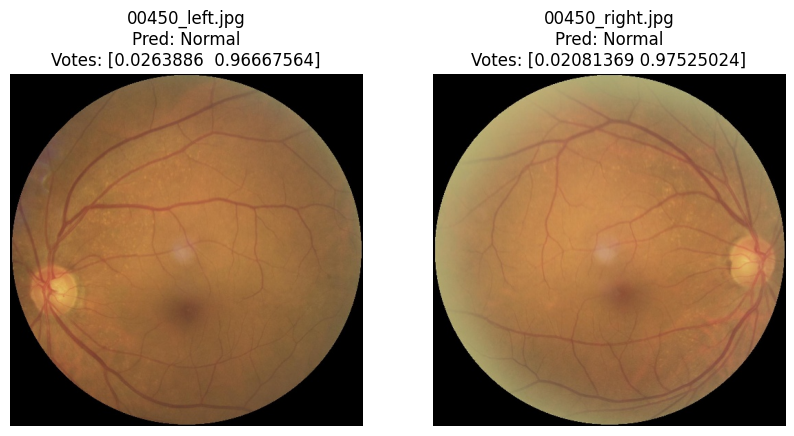


Processing Patient ID: 03314



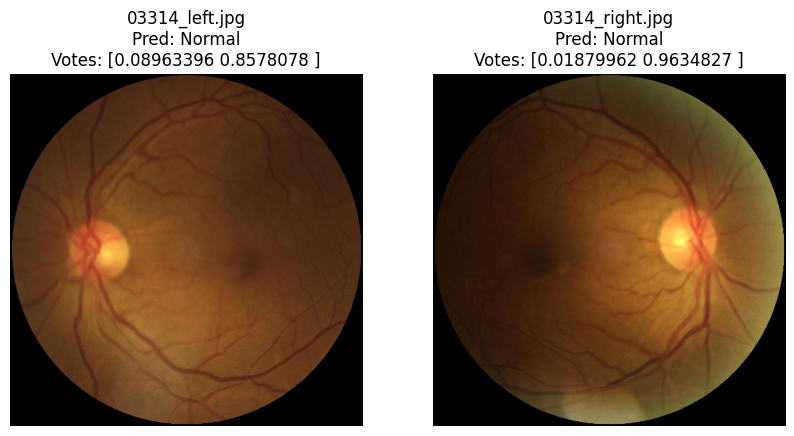


Processing Patient ID: 10023



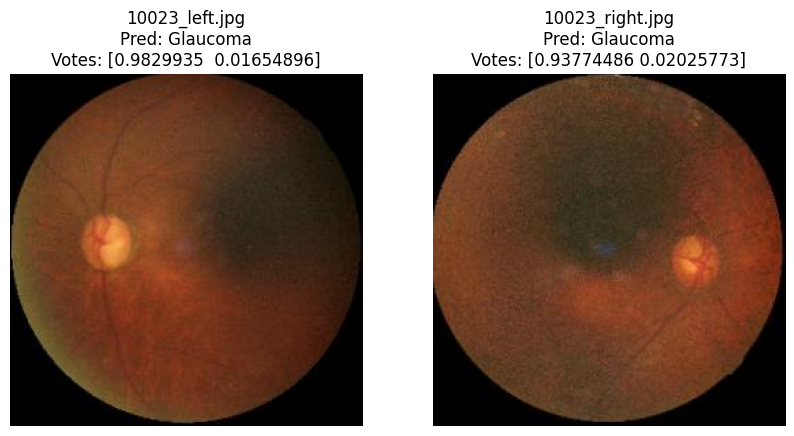


Processing Patient ID: 14354



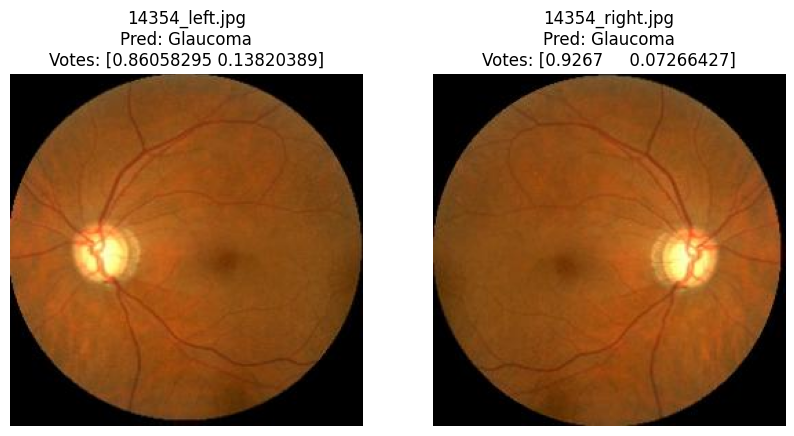


Processing Patient ID: 20034



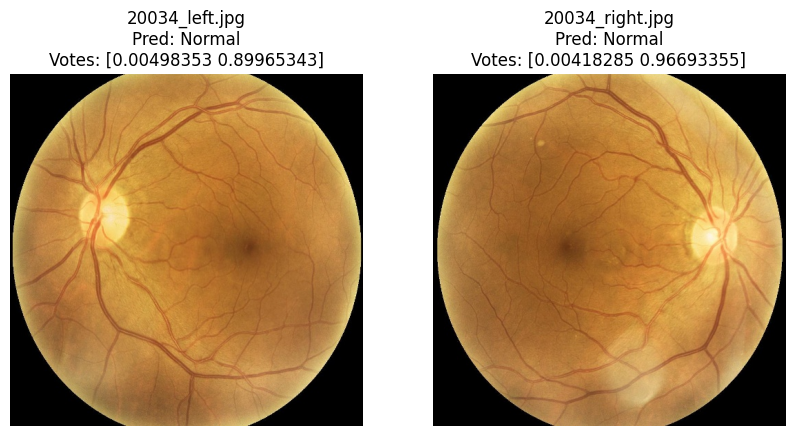


Processing Patient ID: 20045



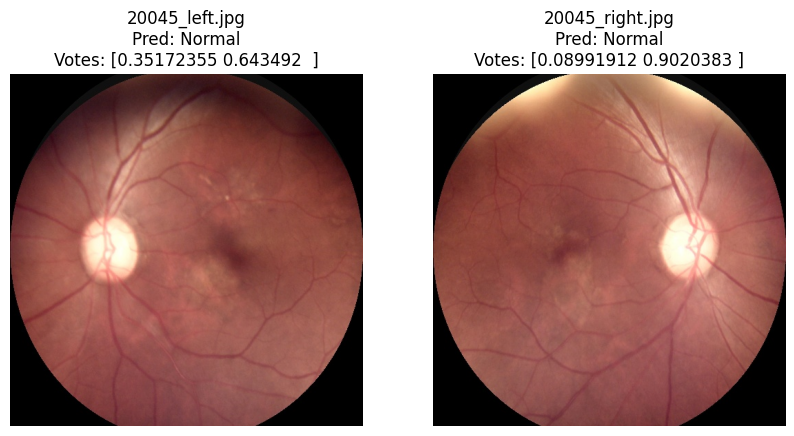


Processing Patient ID: 23432



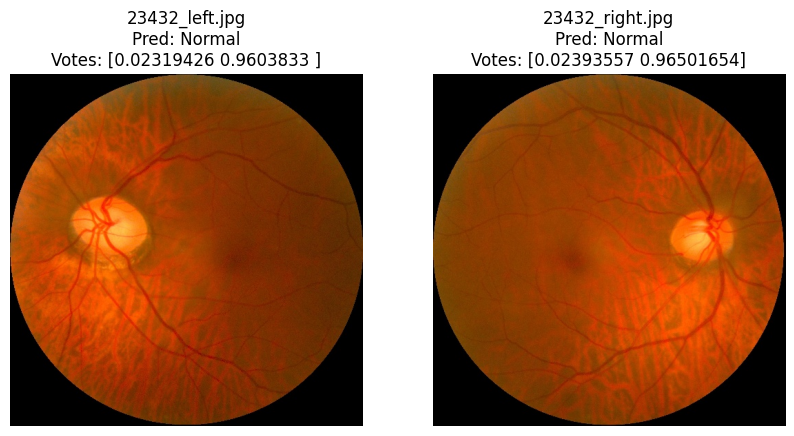


Processing Patient ID: 34534



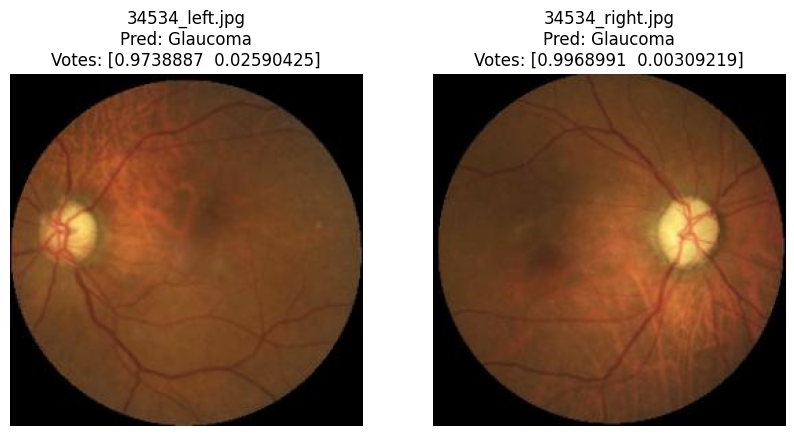


Processing Patient ID: 54315



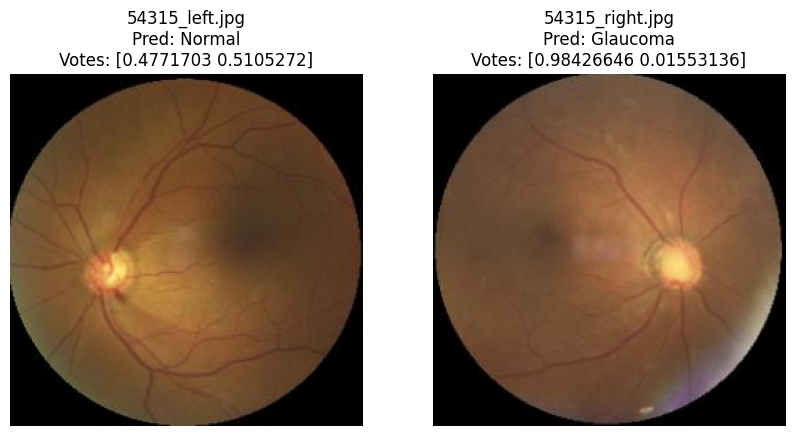


Processing Patient ID: 59414



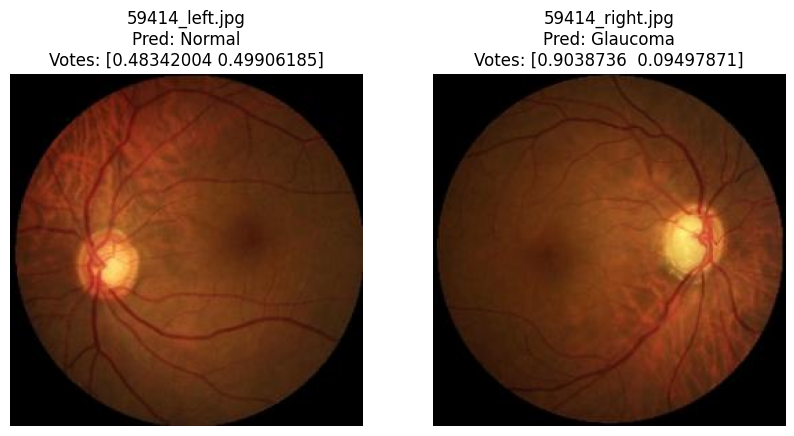

In [5]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Directory containing patient folders with left and right retinal images
data_dir = "Patient Samples"  # Replace with your dataset path

# Load the pre-trained VGG16 model
model_vgg = load_model('model_vgg.h5')

# Updated class labels for the subset of interest
class_labels = ['Glaucoma', 'Normal']  # Only the last two classes in the model output

# Preprocessing function
def preprocess_image(image_path, target_size=(224, 224)):
    """
    Load an image and preprocess it for model prediction.
    Args:
        image_path (str): Path to the image file.
        target_size (tuple): Target size for resizing the image.
    Returns:
        numpy.ndarray: Preprocessed image array.
    """
    image = load_img(image_path, target_size=target_size)  # Load and resize image
    image_array = img_to_array(image)  # Convert to array
    image_array = np.expand_dims(image_array, axis=0)  # Add batch dimension
    image_array = image_array / 255.0  # Normalize pixel values
    return image_array

# Prediction function
def predict_image(image_path, model):
    """
    Predict the class probabilities for a single image.
    Args:
        image_path (str): Path to the image file.
        model (tf.keras.Model): Trained model to use for prediction.
    Returns:
        str: Predicted label.
        list: Probabilities for the last two classes.
    """
    preprocessed_image = preprocess_image(image_path)
    predictions = model.predict(preprocessed_image, verbose=0)[0]
    last_two_predictions = predictions[-2:]
    predicted_label = class_labels[np.argmax(last_two_predictions)]
    return predicted_label, last_two_predictions

# Main loop to process all patients and display their images side by side
for patient_id in os.listdir(data_dir):
    patient_folder = os.path.join(data_dir, patient_id)
    if os.path.isdir(patient_folder):  # Ensure it's a directory
        print(f"\nProcessing Patient ID: {patient_id}\n")
        
        # Collect images and predictions for the patient
        images = []
        predictions = []
        for image_file in os.listdir(patient_folder):
            image_path = os.path.join(patient_folder, image_file)
            if os.path.isfile(image_path):  # Ensure it is a file
                label, votes = predict_image(image_path, model_vgg)
                predictions.append((image_file, label, votes))
                images.append(load_img(image_path))  # Load image for display
        
        # Plot images side by side
        num_images = len(images)
        fig, axes = plt.subplots(1, num_images, figsize=(5 * num_images, 5))
        if num_images == 1:  # Handle case with a single image
            axes = [axes]
        
        for ax, image, pred in zip(axes, images, predictions):
            ax.imshow(image)
            ax.axis('off')
            image_file, label, votes = pred
            ax.set_title(f"{image_file}\nPred: {label}\nVotes: {votes}")
        
        plt.show()



Processing Patient ID: 00450



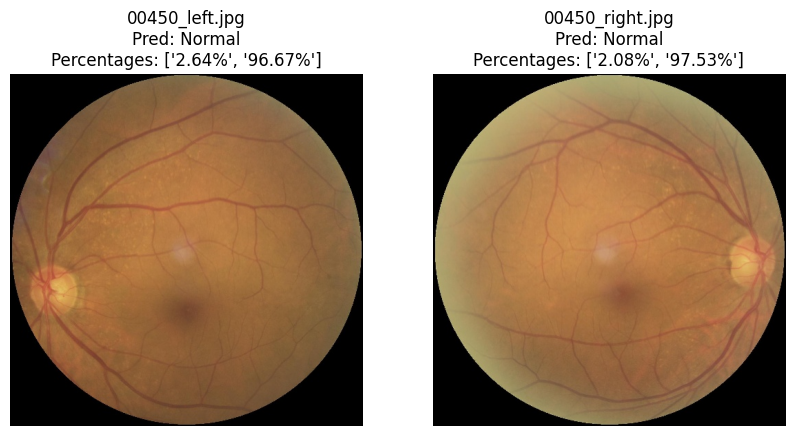


Processing Patient ID: 03314



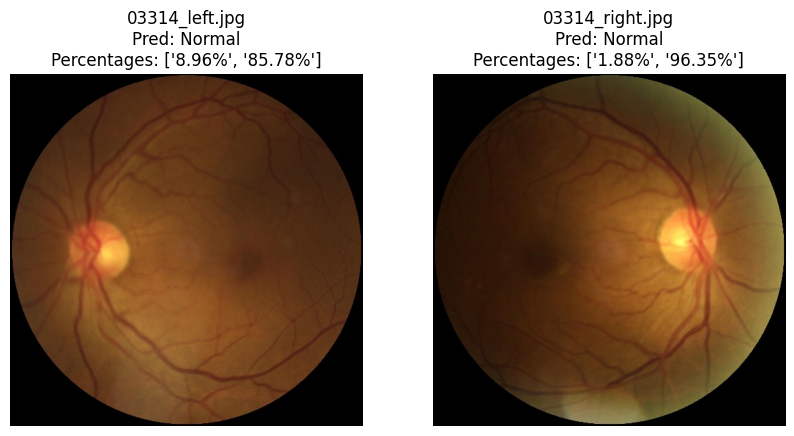


Processing Patient ID: 10023



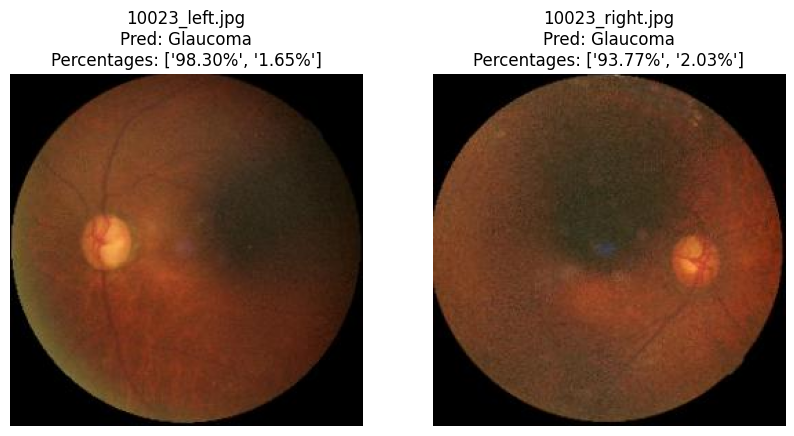


Processing Patient ID: 14354



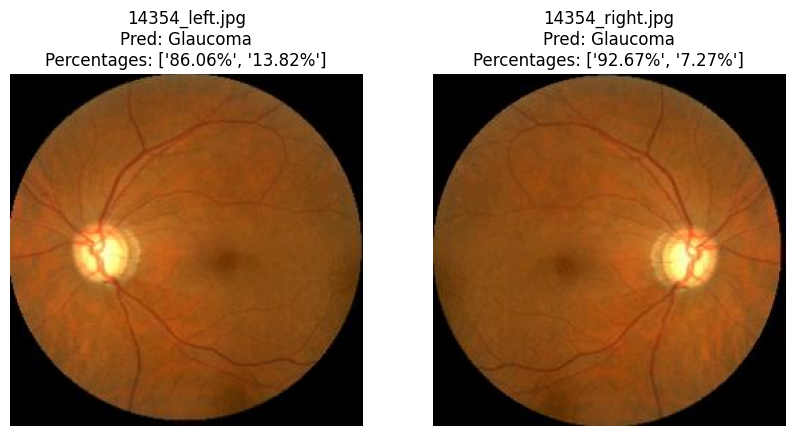


Processing Patient ID: 20034



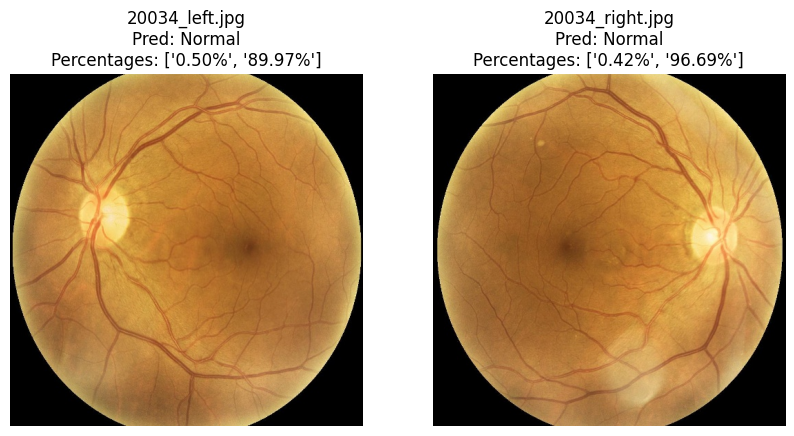


Processing Patient ID: 20045



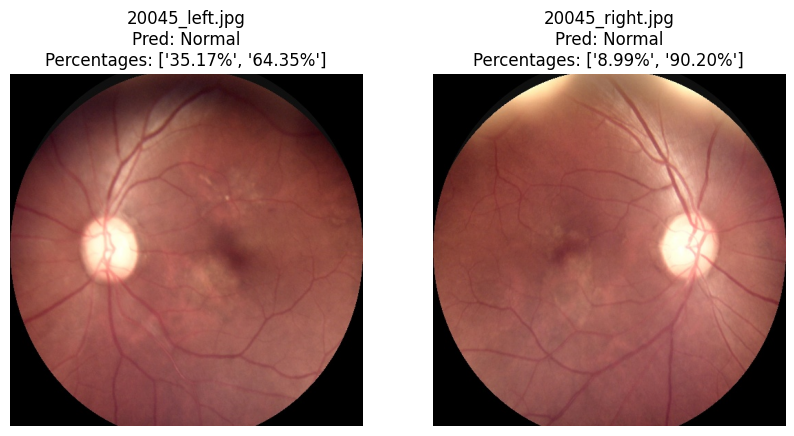


Processing Patient ID: 23432



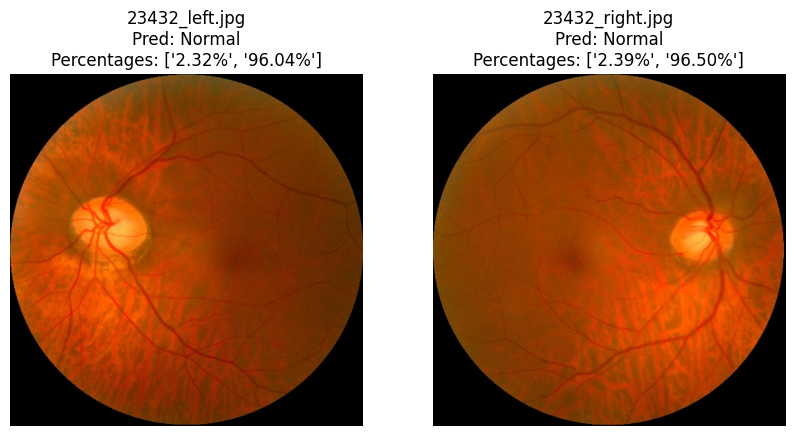


Processing Patient ID: 34534



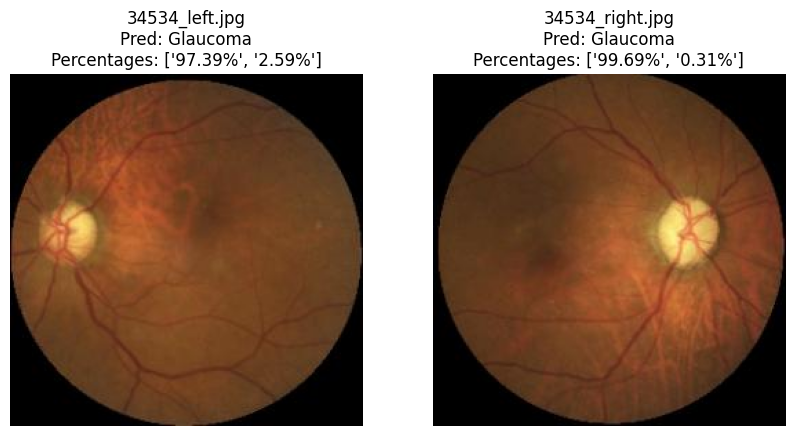


Processing Patient ID: 54315



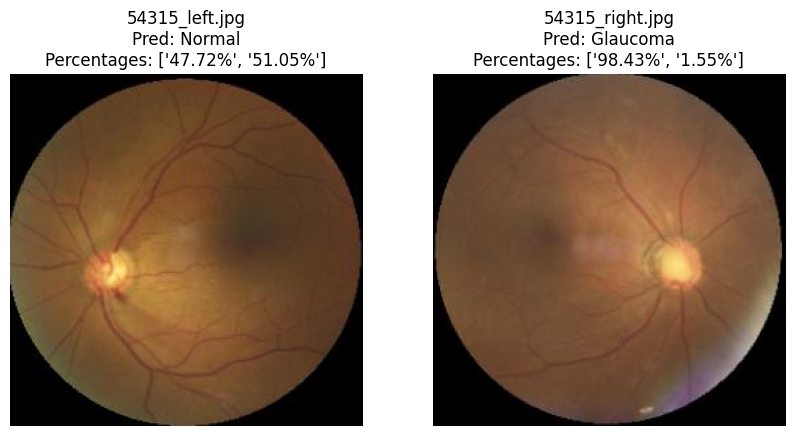


Processing Patient ID: 59414



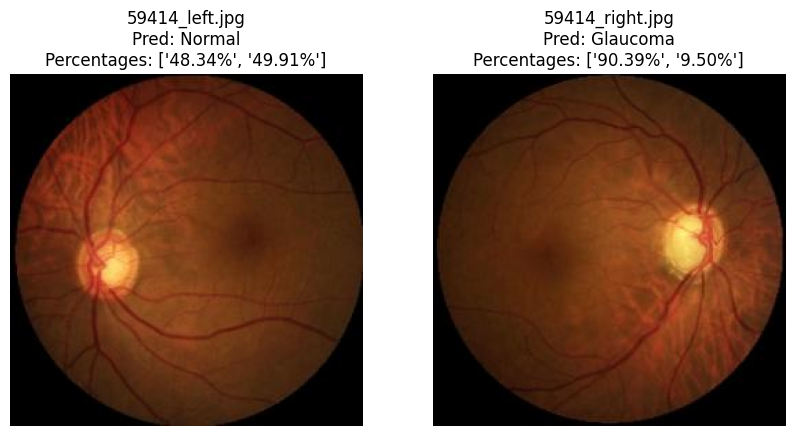

In [6]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Directory containing patient folders with left and right retinal images
data_dir = "Patient Samples"  # Replace with your dataset path

# Load the pre-trained VGG16 model
model_vgg = load_model('model_vgg.h5')

# Updated class labels for the subset of interest
class_labels = ['Glaucoma', 'Normal']  # Only the last two classes in the model output

# Preprocessing function
def preprocess_image(image_path, target_size=(224, 224)):
    """
    Load an image and preprocess it for model prediction.
    Args:
        image_path (str): Path to the image file.
        target_size (tuple): Target size for resizing the image.
    Returns:
        numpy.ndarray: Preprocessed image array.
    """
    image = load_img(image_path, target_size=target_size)  # Load and resize image
    image_array = img_to_array(image)  # Convert to array
    image_array = np.expand_dims(image_array, axis=0)  # Add batch dimension
    image_array = image_array / 255.0  # Normalize pixel values
    return image_array

# Prediction function
def predict_image(image_path, model):
    """
    Predict the class probabilities for a single image.
    Args:
        image_path (str): Path to the image file.
        model (tf.keras.Model): Trained model to use for prediction.
    Returns:
        str: Predicted label.
        list: Percentages for the last two classes.
    """
    preprocessed_image = preprocess_image(image_path)
    predictions = model.predict(preprocessed_image, verbose=0)[0]
    last_two_predictions = predictions[-2:]
    percentages = [f"{p * 100:.2f}%" for p in last_two_predictions]
    predicted_label = class_labels[np.argmax(last_two_predictions)]
    return predicted_label, percentages

# Main loop to process all patients and display their images side by side
for patient_id in os.listdir(data_dir):
    patient_folder = os.path.join(data_dir, patient_id)
    if os.path.isdir(patient_folder):  # Ensure it's a directory
        print(f"\nProcessing Patient ID: {patient_id}\n")
        
        # Collect images and predictions for the patient
        images = []
        predictions = []
        for image_file in os.listdir(patient_folder):
            image_path = os.path.join(patient_folder, image_file)
            if os.path.isfile(image_path):  # Ensure it is a file
                label, percentages = predict_image(image_path, model_vgg)
                predictions.append((image_file, label, percentages))
                images.append(load_img(image_path))  # Load image for display
        
        # Plot images side by side
        num_images = len(images)
        fig, axes = plt.subplots(1, num_images, figsize=(5 * num_images, 5))
        if num_images == 1:  # Handle case with a single image
            axes = [axes]
        
        for ax, image, pred in zip(axes, images, predictions):
            ax.imshow(image)
            ax.axis('off')
            image_file, label, percentages = pred
            ax.set_title(f"{image_file}\nPred: {label}\nPercentages: {percentages}")
        
        plt.show()
